## Area: Macroeconomic data (or quasi-economic) and stock market correlation


## Goal:
- Investigate daily frequency data from FRED and create modular code to prepare the data ingestion by Deep Reinfrocement Learning (DRL) model
- Finding correlations between the FRED variables and Wilshire 5000 Total Stock Index, this will aid in selecting the variables for DRL model

# Steps (code and summaries follow the below sequence):
1. Getting data ready (Download, Process and clean data)
2. Exploratory Data Analysis (Density distributions, Univariate analysis, Bivariate analysis against Wilshire 5000 Total Stock Index) 
3. Further data analysis (Correlation matrix, Stationarity testing, Multicollinearity testing, PCA analysis)
4. Use Seasonal-Trend decomposition using LOESS (STL) to decompose a time series into trend, seasonal, and remainder components and FaceBook's FB Phrophet to forecast future and investigate its ability to capture patterns in seasonality, trends, etc.

##### Created as a final project for Data Analyst course of Nomades Advanced Technologies by Augustas Perminas

###### Thank you for your time in advance :))

In [1]:
#Imports
import numpy as np
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
import math
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
import feature_engine
from feature_engine.timeseries.forecasting import LagFeatures
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import adfuller
import requests
from statsmodels.tsa.seasonal import STL
from statsmodels.stats.outliers_influence import variance_inflation_factor
# from statsmodels.regression.linear_model import OLS
from prophet import Prophet

# 1. Getting data

## 1.1 Download data from FRED (Federal Reserve Economic Data) api, with prime focus on the economic data, but other quasi-economic variables are added

In [2]:
# Daily data that we will check against
fred_series_ids_daily = {
    "1-Month Treasury Constant Maturity Rate" : "DGS1MO", 
    "3-Month Treasury Bill: Secondary Market Rate": "DTB3",  
    "1-Year Treasury Constant Maturity Rate": "DGS1",  
    "2-Year Treasury Constant Maturity Rate": "DGS2",  
    "5-Year Treasury Constant Maturity Rate": "DGS5",  
    "10-Year Treasury Constant Maturity Rate": "DGS10",  
    "Federal Funds Effective Rate": "DFF",  
    "Eurodollar Deposits, London (3-month)": "DED3",  
    "Overnight Reverse Repurchase Agreements: Treasury Securities Sold by the Federal Reserve in the Temporary Open Market Operations": "RRPONTSYD",  # London AM fix price, daily
    "Crude Oil Prices: West Texas Intermediate (WTI)": "DCOILWTICO",  
    "Crude Oil Prices: Brent - Europe" :"DCOILBRENTEU",
    "CBOE Gold ETF Volatility Index": "GVZCLS",
    "S&P 500": "SP500",  
    "Nasdaq Composite Index": "NASDAQCOM",  
    "VIX Volatility Index": "VIXCLS",  
    "Dow Jones Industrial Average": "DJIA",  
    "10-Year Treasury Constant Maturity Minus 2-Year Treasury Constant Maturity": "T10Y2Y",  
    "ICE U.S. Dollar Index": "DTWEXB",  
    "Moody's Seasoned Aaa Corporate Bond Yield": "DAAA",  
    "Moody's Seasoned Baa Corporate Bond Yield": "DBAA",  
    "30-Year Fixed Rate Mortgage Average": "MORTGAGE30US",  
    "Bank Prime Loan Rate": "MPRIME",  
    "Wilshire 5000 Total Market Index": "WILL5000IND",  
    "NYSE Composite Index": "NYA",  
    "Consumer Price Index for All Urban Consumers: All Items in U.S. City Average": "CPILFESL",   
    "U.S. Import Price Index": "IR",   
    "U.S. Export Price Index": "XTEXVA01USM667S",  
    "High Yield Corporate Bond Index": "BAMLH0A0HYM2", #chose to keep it for sanity checks as it is the same data as ICE BofA US High Yield Index Option-Adjusted Spread (OAS)
    "Commercial Paper Interest Rate": "RIFSPPFAAD01NB",  
    "U.S. Total Business Inventories": "BUSINV",   
    "VIX Volatility Index": "VIXCLS",  
    "ICE BofA US High Yield Index Option-Adjusted Spread (OAS)" : "BAMLH0A0HYM2" # measures the spread between a computed OAS index of all bonds in a given rating category and a spot Treasury curve #issue with download
}
    
# fred_series_ids_MONTHLY = {
#     "Consumer Price Index (CPI)": "CPIAUCSL",  # Consumer Price Index for All Urban Consumers: All Items in U.S. City Average
#     "Producer Price Index (PPI)": "PPIACO",  # Producer Price Index by Commodity: All Commodities
#     "Retail Sales": "RSXFS",  # Retail Sales: Excluding Food Services
#     "Industrial Production": "INDPRO",  # Industrial Production: Total Index
#     "Nonfarm Payrolls": "PAYEMS",  # All Employees, Total Nonfarm
#     "Unemployment Rate": "UNRATE",  # Unemployment Rate
#     "Housing Starts": "HOUST",  # New Privately-Owned Housing Units Started: Total Units
#     "Building Permits": "PERMIT",  # New Private Housing Units Authorized by Building Permits
#     "New Home Sales": "HSN1F",  # New Single-Family Houses Sold: United States
#     "Existing Home Sales": "EXHOSLUSM495S",  # Existing Home Sales: Single-family
#     "Personal Income": "PI",  # Personal Income
#     "Personal Consumption Expenditures (PCE)": "PCE",  # Personal Consumption Expenditures
#     "Durable Goods Orders": "DGORDER",  # Manufacturers' New Orders: Durable Goods
#     "Business Inventories": "BUSINV",  # Total Business Inventories
#     "PMI Manufacturing Index": "ISM_MFG",  # ISM Manufacturing: PMI Composite Index
#     "Consumer Confidence Index": "UMCSENT",  # University of Michigan: Consumer Sentiment
#     "Vehicle Sales": "TOTALSA",  # Total Vehicle Sales
#     "Wholesale Trade": "WHLSLRSGAF",  # Wholesale Trade: Durable Goods
#     "Import Prices": "IR",  # Import Price Index
#     "Export Prices": "XTEXVA01USM661S",  # Export Price Index
#     "Consumer Credit": "TOTALSL",  # Total Consumer Credit Owned and Securitized
#     "Bank Lending Survey": "DRSFRMACBS",  # Delinquency Rate on All Loans, All Commercial Banks
#     "Construction Spending": "TTLCONS",  # Total Construction Spending
#     "Money Supply (M2)": "M2SL",  # M2 Money Stock
#     "ISM Services Index": "NAPMSI",  # ISM Non-Manufacturing Index
#     "Personal Saving Rate": "PSAVERT",
#     # "Wilshire 5000 Price Index": "WILL5000PR",
#     # "Wilshire 5000 Total Price Index": "WILL5000IND",
#     "Leading Index for the United States":"USSLIND",
#     "GDP-Based Recession Indicator Index": "JHGDPBRINDX",
#     "NBER based Recession Indicators for the United States from the Period following the Peak through the Trough": "USREC", # 0 for expansion , 1 for recession
#     "GDP": "GDP",
#     "Real Gross Domestic Product": "GDPC1"
# }

In [3]:
# Economic cycle split of data to expansion and recession periods. For the Nomades did not implement it, TBU potentially for the deep reinforcement learning model

economy_cycle_file_location = r"C:\Users\augus\OneDrive\Desktop\Stockholm University\Nomades\Python\MADDQG Team - DQN Variants\economic_cycle_periods.csv"
economy_cycle_file = pd.read_csv(economy_cycle_file_location, encoding='latin1')

columns = ["Recession period Start", "Recession period End", "Expansion period Start", "Expansion period End"]
economy_cycle_file_a = economy_cycle_file[columns].copy()

for col in economy_cycle_file_a.columns:
    economy_cycle_file_a[col] = pd.to_datetime(economy_cycle_file_a[col])  
    economy_cycle_file_a.loc[:, col] = economy_cycle_file_a[col].dt.strftime('%m/%d/%Y')  

display(economy_cycle_file_a)

,Recession period Start,Recession period End,Expansion period Start,Expansion period End
0,1907-05-01,1908-06-01,1908-06-01,1910-01-01
1,1910-01-01,1912-01-01,1912-01-01,1913-01-01
2,1913-01-01,1914-12-01,1914-12-01,1918-08-01
3,1918-08-01,1919-03-01,1919-03-01,1920-01-01
4,1920-01-01,1921-07-01,1921-07-01,1923-05-01
5,1923-05-01,1924-07-01,1924-07-01,1926-10-01
6,1926-10-01,1927-11-01,1927-11-01,1929-08-01
7,1929-08-01,1933-03-01,1933-03-01,1937-05-01
8,1937-05-01,1938-06-01,1938-06-01,1945-02-01
9,1945-02-01,1945-10-01,1945-10-01,1948-11-01


In [4]:
#Download data code (used it in beginning, code not re-used below again for simplicity)

def fetch_all_fred_series_to_csv_daily(macro_indicators, output_filename, api_key = r"aaa6f775822bff58f997598a429f0222"):
    combined_df = pd.DataFrame()  
    
    for series_name, series_id in macro_indicators.items():
        url = f"https://api.stlouisfed.org/fred/series/observations?series_id={series_id}&api_key={api_key}&file_type=json&frequency=d&observation_start=1930-01-01"
        response = requests.get(url)
        data = response.json()

        if response.status_code == 200 and 'observations' in data:

            df = pd.DataFrame(data['observations'])
            if 'date' in df.columns and 'value' in df.columns:
                df = df[['date', 'value']]
                df['value'] = pd.to_numeric(df['value'], errors='coerce')  
                df.rename(columns={'value': series_name}, inplace=True)
                df['date'] = pd.to_datetime(df['date'])  

   
                if combined_df.empty:
                    combined_df = df.set_index('date')
                else:
                    df.set_index('date', inplace=True)
                    combined_df = combined_df.join(df, how='outer')
            else:
                print(f"Data format error for {series_name}")
        else:
            print(f"Failed to fetch data for {series_name}: {data.get('error', 'Unknown error')}")


    combined_df.reset_index(inplace=True)
    combined_df.to_csv(output_filename, index=False)
    print(f"All data has been saved to {output_filename}")
    
def fetch_all_fred_series_to_csv_Monthly(macro_indicators, output_filename, api_key = r"aaa6f775822bff58f997598a429f0222"):
    combined_df = pd.DataFrame() 
    
    for series_name, series_id in macro_indicators.items():

        url = f"https://api.stlouisfed.org/fred/series/observations?series_id={series_id}&api_key={api_key}&file_type=json&frequency=m&observation_start=1930-01-01"
        response = requests.get(url)
        data = response.json()

        if response.status_code != 200 or 'observations' not in data:
            print(f"Monthly data not available for {series_name}, trying quarterly data.")
            url = f"https://api.stlouisfed.org/fred/series/observations?series_id={series_id}&api_key={api_key}&file_type=json&frequency=q&observation_start=1930-01-01"
            response = requests.get(url)
            data = response.json()

        if response.status_code == 200 and 'observations' in data:
            df = pd.DataFrame(data['observations'])
            if 'date' in df.columns and 'value' in df.columns:
                df = df[['date', 'value']]
                df['value'] = pd.to_numeric(df['value'], errors='coerce')
                df.rename(columns={'value': series_name}, inplace=True)
                df['date'] = pd.to_datetime(df['date'])


                if combined_df.empty:
                    combined_df = df.set_index('date')
                else:
                    df.set_index('date', inplace=True)
                    combined_df = combined_df.join(df, how='outer')
            else:
                print(f"Data format error for {series_name}")
        else:
            print(f"Failed to fetch data for {series_name}: {data.get('error', 'Unknown error')}")


    combined_df.reset_index(inplace=True)
    combined_df.to_csv(output_filename, index=False)
    print(f"All data has been saved to {output_filename}")

    combined_df.reset_index(inplace=True)
    combined_df.to_csv(output_filename, index=False)
    print(f"All data has been saved to {output_filename}")

def fetch_all_fred_series_to_csv_various_freq_available(macro_indicators, output_filename, api_key = r"aaa6f775822bff58f997598a429f0222"):
    combined_df = pd.DataFrame()  
    
    for series_name, series_id in macro_indicators.items():
        url = f"https://api.stlouisfed.org/fred/series/observations?series_id={series_id}&api_key={api_key}&file_type=json&observation_start=1930-01-01"
        response = requests.get(url)
        data = response.json()

        if response.status_code == 200 and 'observations' in data:

            df = pd.DataFrame(data['observations'])
            if 'date' in df.columns and 'value' in df.columns:
                df = df[['date', 'value']]
                df['value'] = pd.to_numeric(df['value'], errors='coerce')  
                df.rename(columns={'value': series_name}, inplace=True)
                df['date'] = pd.to_datetime(df['date']) 


                if combined_df.empty:
                    combined_df = df.set_index('date')
                else:
                    df.set_index('date', inplace=True)
                    combined_df = combined_df.join(df, how='outer')
            else:
                print(f"Data format error for {series_name}")
        else:
            print(f"Failed to fetch data for {series_name}: {data.get('error', 'Unknown error')}")

    combined_df.reset_index(inplace=True)
    combined_df.to_csv(output_filename, index=False)
    print(f"All data has been saved to {output_filename}")

# 1.2 Cleaning and standardizing data

In [5]:
df_daily_path = r"C:\Users\augus\OneDrive\Desktop\Stockholm University\Nomades\Python\MADDQG Team - DQN Variants\Macro_agent\EDA\fred_series_ids_DAILY.csv" # Downloaded file
df_daily = pd.read_csv(df_daily_path)

In [6]:
def split_and_clean_data(df, data_split, for_nan_remove_rows_or_impute_with_mean="remove_rows"):
    print("Original DataFrame size:", df.shape)  # diagnostics: check original DataFrame size
    print("\n Basic statistics:\n ")
    print(df.info())
    
    # ensure the date column is a datetime type and format it to day-month-year
    df['date'] = pd.to_datetime(df['date']).dt.strftime('%m/%d/%Y')
    df['date'] = pd.to_datetime(df['date'], format='%m/%d/%Y')  # reconvert to datetime without time
    
    if for_nan_remove_rows_or_impute_with_mean == "remove_rows":
        df = df.dropna()  # ensure DataFrame is updated after dropping NaN
        print("\n DataFrame size after dropping rows:", df.shape)  # Diagnostics
    elif for_nan_remove_rows_or_impute_with_mean == "impute_with_mean":
        means = df.select_dtypes(include=[np.number]).mean()
        df = df.fillna(means)  
        print("\n DataFrame size after imputing mean:", df.shape)  # Diagnostics
    else:
        raise ValueError("\n Not clear instructions what to do with missing values")

    df = df.reset_index(drop=True)  # reset index after modifying rows
    df_no_date = df.drop(columns=["date"], errors='ignore')
    data_index = int(len(df) * (data_split / 100))

    macro_train_w_date = df.iloc[:data_index].reset_index(drop=True)
    macro_test_w_date = df.iloc[data_index:]
    macro_train_no_date = df_no_date.iloc[:data_index]
    macro_test_no_date = df_no_date.iloc[data_index:]

    # Check for NaNs, infinities, or zeroes
    has_infinities_or_nans = df.isnull().values.any() or np.isinf(df.select_dtypes(include=[np.number])).values.any()
    print("\n Contains infinite or NaN values:", has_infinities_or_nans)

    print("\n Unique values per column:")
    print(df.nunique())

    print("\n Descriptive statistics:")
    print(df.describe())

    has_zeros = (df.select_dtypes(include=[np.number]) == 0).any().any()
    print("\n Contains zero values:", has_zeros)

    return (df, macro_train_w_date, macro_test_w_date, df_no_date, macro_train_no_date, macro_test_no_date, data_index)


def standardize_data(df, data_split): #could of used simple StandardScaler
    df_copy = df.copy()  
    
    if "date" in df_copy.columns:
        df_copy.drop(columns=['date'], inplace=True)
    
    data_index = int(len(df_copy) * (data_split / 100))
    train_means = df_copy.iloc[:data_index].mean()
    train_std_devs = df_copy.iloc[:data_index].std()
    
    df_standardized = (df_copy - train_means) / train_std_devs
    df_standardized = df_standardized.reset_index(drop=True)

    df_standardized_train = df_standardized.iloc[:data_index]
    df_standardized_test = df_standardized.iloc[data_index:]

    # optionally, we can add back the dates here if needed
    # df_standardized['date'] = df['date']
    
    # check for NaNs, infinities, or zeroes
    has_infinities_or_nans = df_standardized.isnull().values.any() or np.isinf(df_standardized.select_dtypes(include=[np.number])).values.any()
    print("\n Contains infinite or NaN values:", has_infinities_or_nans)

    print(" \nUnique values per column:")
    print(df_standardized.nunique())

    print("\n Descriptive statistics:")
    print(df_standardized.describe())

    has_zeros = (df_standardized.select_dtypes(include=[np.number]) == 0).any().any()
    print("\n Contains zero values:", has_zeros)

    return df_standardized, df_standardized_train, df_standardized_test

def standardize_data_by_period(df, periods_location, data_split):  # Code that standardizes the dataset based on the 
                                                                   # properties of the data splits (depending if the expansionary or recessionary period is present)
    periods_location = r"C:\Users\augus\OneDrive\Desktop\Stockholm University\Nomades\Python\MADDQG Team - DQN Variants\economic_cycle_periods.csv"
    periods = pd.read_csv(periods_location, encoding='latin1')
    columns = ["Recession period Start", "Recession period End", "Expansion period Start", "Expansion period End"]
    periods = periods[columns]
    # for col in periods.columns: #not needed, just in case to keep for now
    #     periods[col]=pd.to_datetime(periods[col]).dt.strftime('%m-/%d-%Y')
    #     periods[col]=pd.to_datetime(periods[col], format='%m-/%d-%Y')
    
    df_copy = df.copy()
    df_standardized = pd.DataFrame(index=df.index)
    
    # Assume 'DATE' is already converted to datetime
    df_copy['DATE'] = pd.to_datetime(df_copy['DATE'])

    columns_to_standardize = df_copy.select_dtypes(include=['float64', 'int']).columns

    for _, row in periods.iterrows():
        # Parse dates from the periods DataFrame
        start_recession = pd.to_datetime(row['Recession period Start'])
        end_recession = pd.to_datetime(row['Recession period End'])
        start_expansion = pd.to_datetime(row['Expansion period Start'])
        end_expansion = pd.to_datetime(row['Expansion period End'])
        # print(f"for this run we have this info: start_recession{start_recession},end_recession{end_recession}\n"
        #     f"start_expansion{start_expansion},end_expansion{end_expansion} ")

        # Process recession period
        recession_mask = (df_copy['date'] >= start_recession) & (df_copy['date'] <= end_recession)
        if recession_mask.any():
            recession_slice = df_copy.loc[recession_mask, columns_to_standardize]
            recession_means = recession_slice.mean()
            recession_stds = recession_slice.std()
            df_standardized.loc[recession_mask, columns_to_standardize] = (recession_slice - recession_means) / recession_stds
            # print(f" recession_slice {recession_slice}, \n recession_means {recession_means}, recession_stds {recession_stds}")

        #process expansion period
        expansion_mask = (df_copy['date'] >= start_expansion) & (df_copy['date'] <= end_expansion)
        if expansion_mask.any():
            expansion_slice = df_copy.loc[expansion_mask, columns_to_standardize]
            expansion_means = expansion_slice.mean()
            expansion_stds = expansion_slice.std()
            df_standardized.loc[expansion_mask, columns_to_standardize] = (expansion_slice - expansion_means) / expansion_stds
            # print(f" expansion_slice {expansion_slice}, \n expansion_means {expansion_means}, expansion_stds {expansion_stds}")

 #reinsert 'DATE' column at the beginning
    df_standardized.insert(0, 'date', df_copy['date'])
    data_index = int(len(df_standardized) * (data_split / 100))
    df_standardized_train = df_standardized.iloc[:data_index]
    df_standardized_test = df_standardized.iloc[data_index:]

    return df_standardized, df_standardized_train, df_standardized_test


In [7]:
# cleaned dataframes

df_daily_clean, macro_train_w_date, macro_test_w_date, df_no_date, macro_train_no_date, macro_test_no_date, data_index = split_and_clean_data(df_daily, 80, for_nan_remove_rows_or_impute_with_mean="remove_rows")
# df_d, macro_train_w_date, macro_test_w_date, df_no_date, macro_train_no_date, macro_test_no_date, data_index = split_and_clean_data(df_daily, 80, for_nan_remove_rows_or_impute_with_mean="impute_with_mean")

Original DataFrame size: (5684, 19)

 Basic statistics:
 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5684 entries, 0 to 5683
Data columns (total 19 columns):
 #   Column                                                                      Non-Null Count  Dtype  
---  ------                                                                      --------------  -----  
 0   date                                                                        5684 non-null   object 
 1   1-Month Treasury Constant Maturity Rate                                     5684 non-null   float64
 2   3-Month Treasury Bill: Secondary Market Rate                                5684 non-null   float64
 3   1-Year Treasury Constant Maturity Rate                                      5684 non-null   float64
 4   2-Year Treasury Constant Maturity Rate                                      5684 non-null   float64
 5   5-Year Treasury Constant Maturity Rate                                      5684 non-null   flo

In [8]:
df_standardized, df_standardized_train, df_standardized_test = standardize_data(df_daily_clean, 80) #standardized data


 Contains infinite or NaN values: False
 
Unique values per column:
1-Month Treasury Constant Maturity Rate                                        538
3-Month Treasury Bill: Secondary Market Rate                                   507
1-Year Treasury Constant Maturity Rate                                         524
2-Year Treasury Constant Maturity Rate                                         514
5-Year Treasury Constant Maturity Rate                                         498
10-Year Treasury Constant Maturity Rate                                        475
Federal Funds Effective Rate                                                   430
Crude Oil Prices: West Texas Intermediate (WTI)                               4102
Crude Oil Prices: Brent - Europe                                              4176
Nasdaq Composite Index                                                        5525
VIX Volatility Index                                                          2219
10-Year Treasury C

# 2. Exploratory Data Analysis

# 2.1 Density Distribution


- We have 18 variables that are obtained from the FRED database
- Treasury rates for 1 month, 3 month, 1 year maturities show a density distribution with high density close to the 0% rate with a steep drop off as rates increase. Hence, periods of lower rates for the 3 periods are more common
- Treasury rates for 2, 5, 10 years distributions appear to be more spread out with multiple peaks, indicating variability in interest rates over different periods
- Federal funds rate shows a right-skewed distribution, with a high frequency of lower rates, similar to the shorter-term Treasury rates
- Both West Texas Intermediate (WTI) and Brent crude oil prices display multi-modal distributions with several peaks, suggesting that oil prices have fluctuated within certain ranges repeatedly over time
- NASDAQ composite index shows right-skewed distribution with a peak close to the smalle price, which may reflect the long-term upward trend in the index with periods of rapid growth resulting in the tail on the right side
- VIX volatility index shows a right-skewed distribution with relatively clear peak at lower levles.  Indicating that extended periods of market stability with lower volatility are more common than high-volatility events, which are rarer but can reach extreme levels
- 10-Year Treasury Constant Maturity Minus 2-Year Constant Maturity shows that this spread's distribution appears multimodal, suggesting different market conditions where the yield curve has varied between flattening (), steepening, and inverting
- Moody's Seasoned Aaa and Baa Corporate Bond Yields, these yields also show a multimodal distribution, showing varying bond yields in different market conditions, while the yield of safer Aaa bonds show lower premium range (More or less from 2-7%), while moreinherently risky Baa bonds yields may yield higher returns (around 3-9%)
- Wilshire 5000 Total Market Index shows the right skew of its index density peaking around 50, however going up to the 250, which aligns with the long-term growth trend observed in the total market index, indicative of overall market expansion over time
- High Yield Corporate Bond Index and Option-Adjusted Spread (OAS) both showcase a right skewed distribution, with arguable single peak. The high-yield bond index's skewness is consistent with the higher yields associated with riskier corporate debt during specific periods, while the OAS distribution suggests that typically spreads are low but can widen significantly during times of financial stress
- Commercial Paper Interest Rate shows a heavily right-skewed distribution with rates commonly being lower, which is typical for short-term corporate borrowing instruments in a generally low-interest-rate environment.

Below we will plot also the standardized data, where the data's mean is at 0, and standard deviation of 1. This shows the same distribution just on the same scale of the number standard deviations away from mean. Overall, can be noted that the data we are working with is multidimensional and with different statistical properties, hence to carry out an in-depth correlation/ predictice power analysis against the stock market prices is complex. 

Shortcomings - given the different types of data, the good step would be to check the daily or running average log differences between the dates. This would better show the distribution of periodic swings, particularly when dealing with financial data or other types of data that may exhibit significant temporal dependencies and volatilities.

In [9]:
def plot_distplot_for_each_column(df):
    # exclude 'DATE' column if present
    columns_to_plot = df.columns.drop('date') if 'date' in df.columns else df.columns
    
    num_cols = len(columns_to_plot)
    num_rows = math.ceil(num_cols / 3)  # Calculate the number of rows required

    fig, axes = plt.subplots(num_rows, 3, figsize=(20, 5*num_rows))
    fig.subplots_adjust(hspace=0.5)

    for i, column in enumerate(columns_to_plot):
        row_num = i // 3
        col_num = i % 3
        ax = axes[row_num, col_num] if num_rows > 1 else axes[col_num]
        sns.histplot(df[column].dropna(), kde=False, ax=ax)  # plot distribution plot for each column
        ax.set_title(f'Frequency distribution')
        ax.set_xlabel(column)
        ax.set_ylabel('Freq.')

    # Hide any empty subplots
    for i in range(num_cols, num_rows * 3):
        row_num = i // 3
        col_num = i % 3
        axes[row_num, col_num].axis('off')

    plt.show()

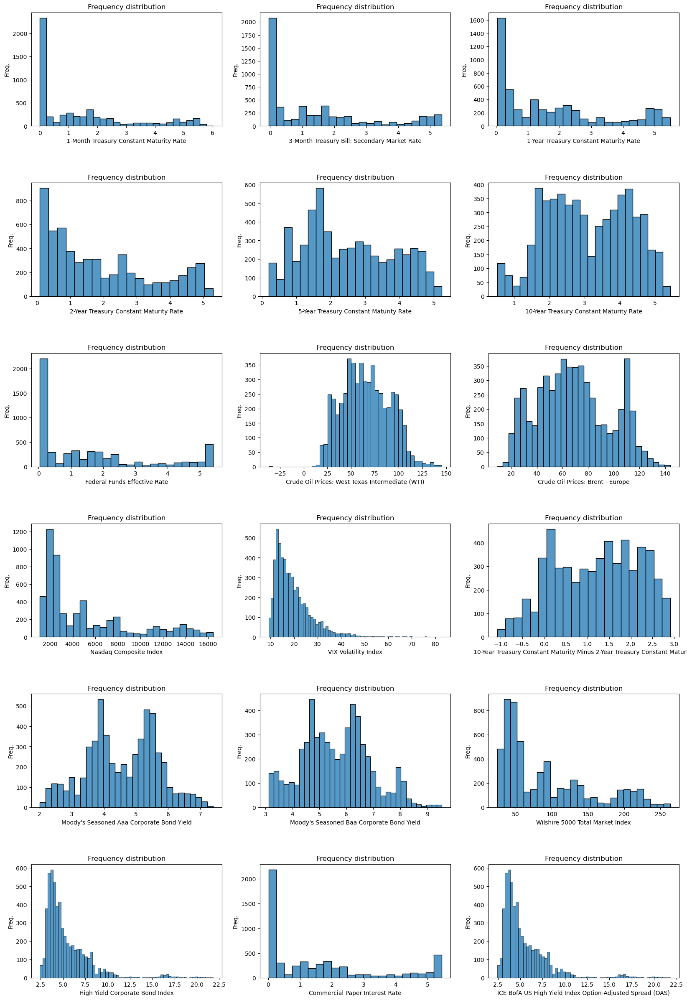

In [10]:
#plot of the cleaned data
plot_distplot_for_each_column(df_daily_clean)

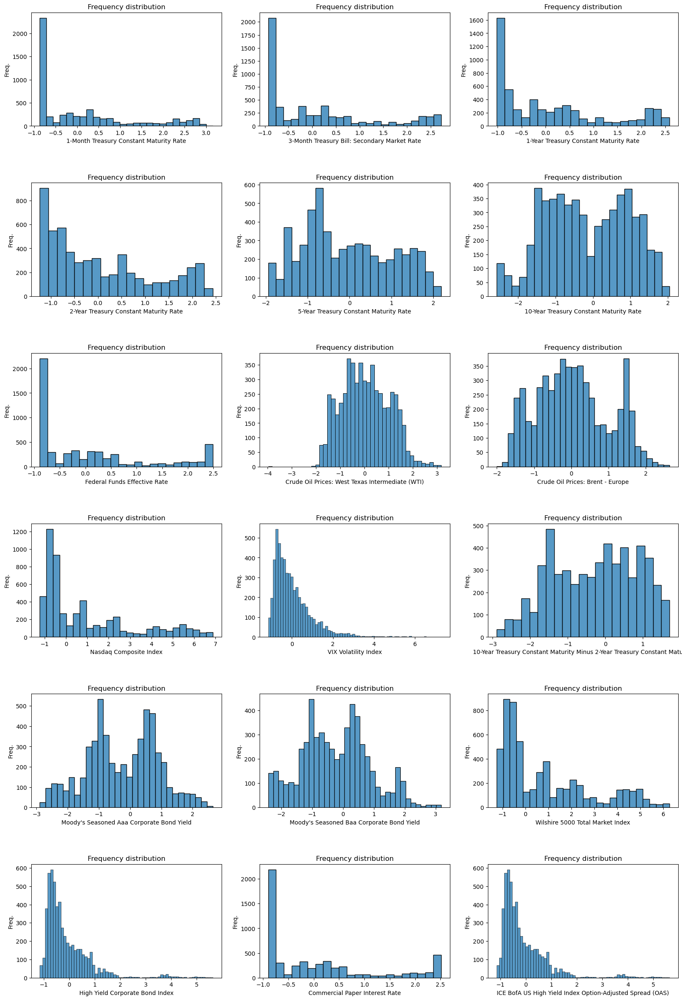

In [11]:
#plot of data that is cleaned and standardized
plot_distplot_for_each_column(df_standardized)

## 2.2 Univariate analysis

Additional pollting for the variables - density distribution, box-lot(good to see main statistical moments), and a log difference density distribution.
The previous plots were decent enough to "get a feel" for the data and the below plots will add just bit more understanding. Additional findings would be overlapping, hence not detailed.

In [12]:
def plot_univariate_analysis(df):

    columns_to_plot = df.columns.drop('date') if 'date' in df.columns else df.columns

    num_cols = 3  
    num_plots_per_variable = 3  
    num_rows_per_variable = math.ceil(num_plots_per_variable / num_cols) 
    total_rows = num_rows_per_variable * len(columns_to_plot) 

    fig, axes = plt.subplots(total_rows, num_cols, figsize=(20, 5 * total_rows))
    fig.subplots_adjust(hspace=0.5, wspace=0.5)
   
    for i, variable in enumerate(columns_to_plot):
        base_row = i * num_rows_per_variable

        sns.histplot(df[variable], kde=True, ax=axes[base_row, 0])
        axes[base_row, 0].set_title(f'Histogram for {variable}')
        axes[base_row, 0].set_xlabel(variable)
        axes[base_row, 0].set_ylabel('Frequency')

        sns.boxplot(x=df[variable], ax=axes[base_row, 1])
        axes[base_row, 1].set_title(f'Box Plot for {variable}')
        axes[base_row, 1].set_xlabel(variable)

        if df[variable].min() > 0:
            df[f'log_diff_{variable}'] = np.log(df[variable]).diff()
            sns.histplot(df[f'log_diff_{variable}'].dropna(), kde=True, ax=axes[base_row, 2])
            axes[base_row, 2].set_title(f'Log Diff Histogram for {variable}')
            axes[base_row, 2].set_xlabel('Log Differences')
            axes[base_row, 2].set_ylabel('Frequency')
        else:

            axes[base_row, 2].text(0.5, 0.5, 'Non-positive values\nNo log diff', 
                                ha='center', va='center', transform=axes[base_row, 2].transAxes)
            axes[base_row, 2].axis('off')

    plt.tight_layout()
    plt.show()




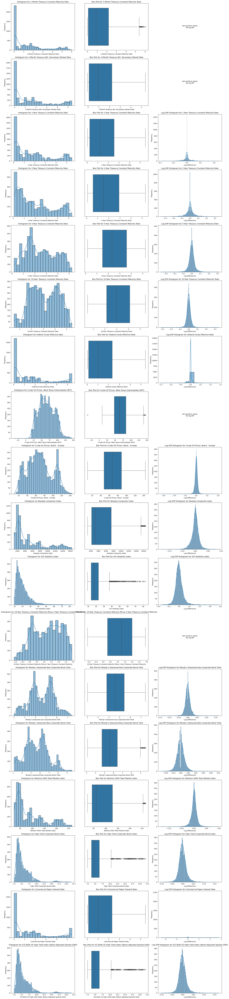

In [13]:
plot_univariate_analysis(df_daily_clean)

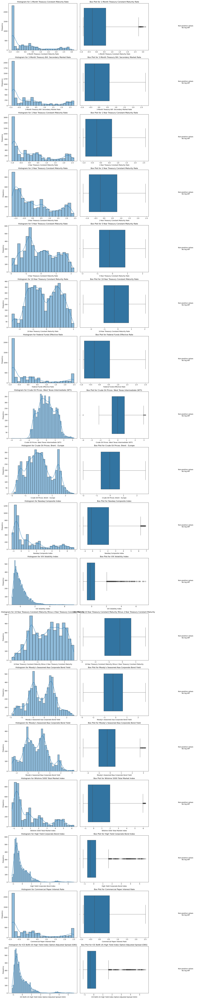

In [14]:
plot_univariate_analysis(df_standardized)

## 2.3 Bivariate analysis

- Comparing the variables against the Wilshire 5000 Total Market Index, Again, primarily the case is to get the feeling from plotting, while drawing conclusions from data would be too early.
- Outcome and shortcoming of the bivariate analysis shows that a clearcut linear correlation is not present in the plots
- The bivariate analysis shows the clearest correlation between Nasdaq and Wilshire5000 index, which is to be expected given the upward gortht trend of the two indexes (amongst other features, driving the correlation). 
- Just based on plots, I choose to stay away from deriving further insights given plots show complex bivariate patterns.

In [15]:
def plot_graph_with_trendline(df, y_values:str):

    columns_to_plot = df.columns.drop('date') if 'date' in df.columns else df.columns
    
    num_cols = len(columns_to_plot)
    num_rows = math.ceil(num_cols / 3)  

    fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5*num_rows))
    fig.subplots_adjust(hspace=0.5)

    for i, column in enumerate(columns_to_plot):
        row_num = i // 3
        col_num = i % 3
        ax = axes[row_num, col_num] if num_rows > 1 else axes[col_num]
        
        x = df[column]
        y = df[y_values]
        ax.scatter(x, y, alpha = 0.1, s = 5, c = "orange", edgecolors = "none")
        ax.set_title(f'Scatter plot with trendline')
        ax.set_xlabel(column)
        ax.set_ylabel(y_values)
        ax.tick_params(axis='x', rotation=45)
        
        sns.regplot(x=x, y=y, scatter=False, ax=ax)


    for i in range(num_cols, num_rows * 3):
        row_num = i // 3
        col_num = i % 3
        axes[row_num, col_num].axis('off')

    plt.show()

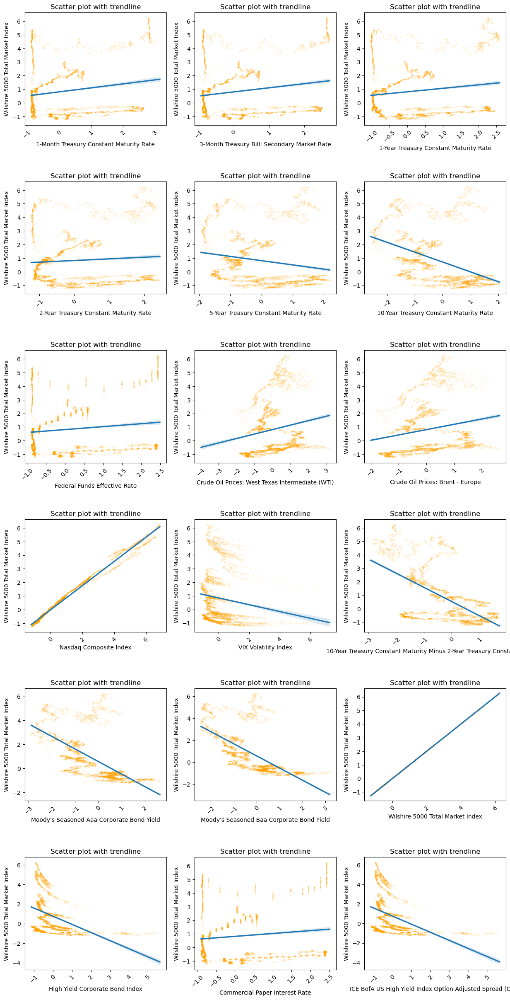

In [16]:
plot_graph_with_trendline(df_standardized, y_values='Wilshire 5000 Total Market Index') #standardize data

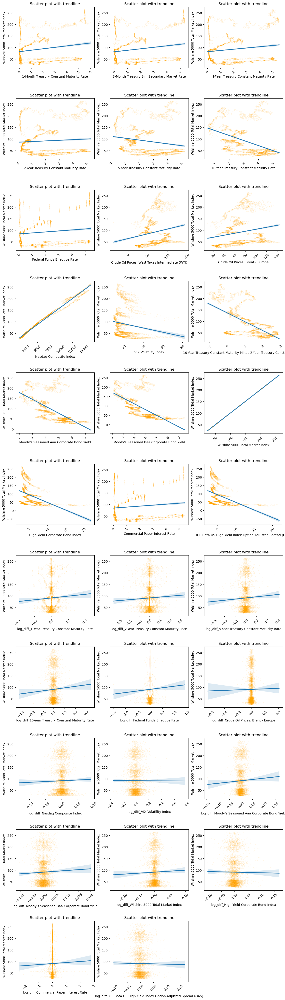

In [17]:
plot_graph_with_trendline(df_daily_clean, y_values='Wilshire 5000 Total Market Index') # only cleaned data plotting 

In [18]:
def plot_graph_with_trendline_rolling_mean(df, y_values:str, window_size=7):
    columns_to_plot = [col for col in df.columns if col != 'date']
    rolling_dfs = {col: df[col].rolling(window=window_size).mean() for col in columns_to_plot}
    
    num_cols = len(columns_to_plot)
    num_rows = math.ceil(num_cols / 3) 

    fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5*num_rows))
    fig.subplots_adjust(hspace=0.5)

    for i, column in enumerate(columns_to_plot):
        row_num = i // 3
        col_num = i % 3
        ax = axes[row_num, col_num] if num_rows > 1 else axes[col_num]
        
        x = rolling_dfs[column].dropna()  
        y = df.loc[x.index, y_values]     
        
        ax.scatter(x, y, alpha=0.1, s=5, c="orange", edgecolors="none")
        ax.set_title(f'Rolling Mean ({window_size} days)')
        ax.set_xlabel(f'{column} (rolling mean)')
        ax.set_ylabel(y_values)
        ax.tick_params(axis='x', rotation=45)

        sns.regplot(x=x, y=y, scatter=False, ax=ax)

    for i in range(num_cols, num_rows * 3):
        row_num = i // 3
        col_num = i % 3
        if row_num < num_rows and col_num < 3:
            axes[row_num, col_num].axis('off')

    plt.tight_layout()
    plt.show()

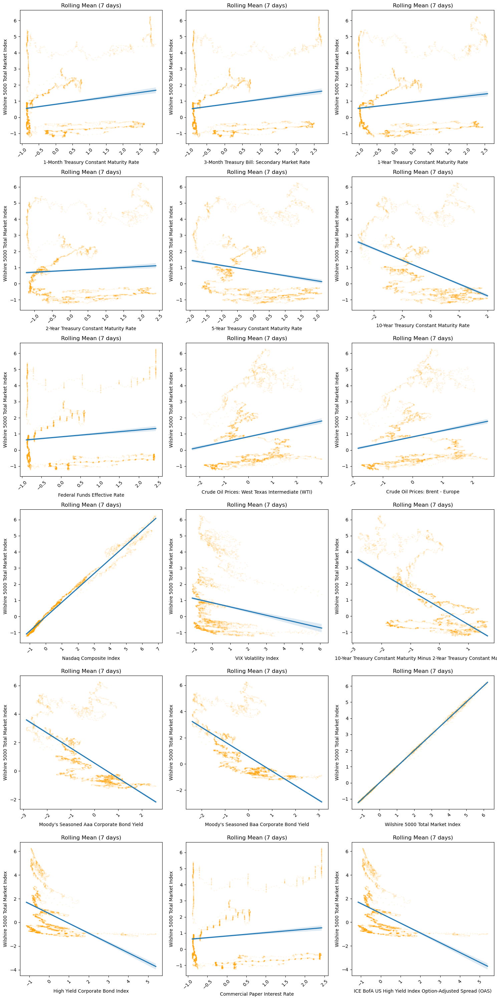

In [19]:
plot_graph_with_trendline_rolling_mean(df_standardized, y_values='Wilshire 5000 Total Market Index')

In [20]:
def plot_graph_with_trendline_for_log_deltas(dfa, y_values):
    df = dfa.copy()
    df = df.apply(pd.to_numeric, errors='coerce')
    df = df[(df[df.columns] != 0).all(axis=1)]

    columns_to_plot = df.columns.drop('date') if 'date' in df.columns else df.columns

    num_cols = len(columns_to_plot)
    num_rows = math.ceil(num_cols / 3)

    fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
    fig.subplots_adjust(hspace=0.5)

    for i, column in enumerate(columns_to_plot):
        row_num = i // 3
        col_num = i % 3
        ax = axes[row_num, col_num] if num_rows > 1 else axes[col_num]

        #log differences
        x = np.log(df[column] / df[column].shift(1)).dropna()
        y = np.log(df[y_values] / df[y_values].shift(1)).shift(-1).loc[x.index]  # shifting

        ax.scatter(x, y, alpha=0.1, s=5, c="orange", edgecolors="none")
        ax.set_title(f'Logarithmic Deltas')
        ax.set_xlabel(f'{column} (log change)')
        ax.set_ylabel(f'{y_values} (log change)')
        ax.tick_params(axis='x', rotation=45)

        # adding a regression line to each plot
        sns.regplot(x=x, y=y, scatter=False, ax=ax, color='blue')

    # turn off any unused subplots
    for j in range(num_cols, num_rows * 3):
        row_num = j // 3
        col_num = j % 3
        if row_num < num_rows and col_num < 3:
            axes[row_num, col_num].axis('off')

    plt.tight_layout()
    plt.show()

c:\Users\augus\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


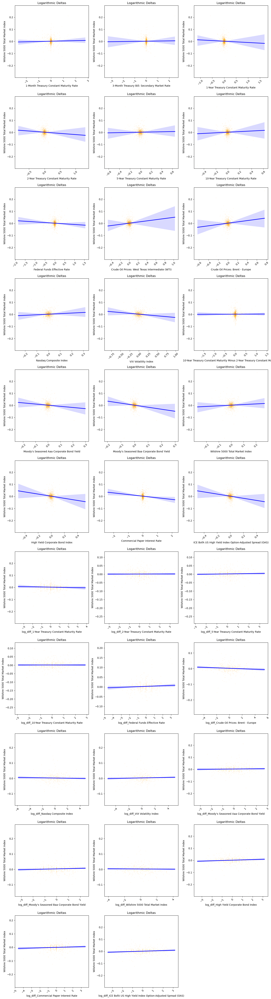

In [21]:
plot_graph_with_trendline_for_log_deltas(df_daily_clean,y_values = 'Wilshire 5000 Total Market Index')

# 3. Further data analysis

## 3.1 Correlation matrix heatmap

Logarithmic differences correlation shows that Wilshire5000 index has some more interesting outcomes

- Treasury Rates and Federal Funds Rate: 
    - most of the Treasury rates, ranging from 1-month to 10-year, have a tiny negative correlation with the Wilshire 5000. This means that changes in these rates don't really mirror the stock market's movements very closely. When we look at the log differences, the correlation turns positive, especially for longer maturities like 2, 5, and 10 years. This suggests that the day-to-day changes in these rates could be more aligned with how the stock market moves
- Crude Oil Prices: 
    - both WTI and Brent crude have a slight negative tie-up with the Wilshire 5000, indicating that daily price changes in oil don't seem to impact the stock market much. But, the log differences tell a different story, showing a stronger positive link, particularly for Brent. It looks like trends in oil prices might actually sway stock market trends.
- Nasdaq Composite Index: 
    - there’s a strong positive correlation here, nearly 0.95, showing that these two indices probably move in sync, likely because they share many of the same companies or are influenced by similar market factors
- VIX Volatility Index: 
    - the VIX shows a significantly negative correlation when we look at log differences. Essentially, when the market gets more volatile (and uncertain), the overall market index tends to drop, which is pretty typical since investors usually pull back during uncertain times
- Corporate Bond Yields and High Yield Index:
   - the story with corporate bonds is complex. The raw data shows a negative correlation, but the log differences flip to positive. This reflects a complex dance where bond yields might counter or follow stock market trends depending on the broader economic atmosphere.
- Commercial Paper Interest Rate:
   - showing very minimal influence on the stock market, whether we are looking at daily changes or trends over time
- Special Case - High Yield Index and VIX Log Differences:
   - both of these have quite strong negative correlations in their log differences. What this means is that as the market’s perceived risk shoots up, high-yield bonds and the broader market tend to take a hit

In [22]:
def plot_corr_matrix(dfa):
    df = dfa.copy()
    for column in df.columns:
        if df[column].dtype in [np.float64, np.int64]:  
            df[f'log_diff_{column}'] = np.log(df[column] / df[column].shift(1))

    df_numeric = df.select_dtypes(include=[np.number]).drop(columns='date', errors='ignore') 

    if df_numeric.shape[1] < 2:
        print("Not enough numeric columns to calculate correlations.")
        return

    correlation_matrix = df_numeric.corr()
    
    if correlation_matrix.size < 1 or correlation_matrix.isnull().all().all():
        print("Failed to generate a valid correlation matrix.")
        return

    fig, ax = plt.subplots(figsize=(25, 25))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", square=True, cbar=True, ax=ax, cmap=sns.diverging_palette(235, 20, l=65, center="dark", as_cmap=True))
    plt.title('Correlation Matrix')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.show()

def print_corr_matrix(dfa):
    df = dfa.copy()
    for column in df.columns:
        if df[column].dtype in [np.float64, np.int64]:  
            df[f'log_diff_{column}'] = np.log(df[column]+ 1e-9 / df[column].shift(1)+ 1e-9) #small constant
    
    df_numeric = df.select_dtypes(include=[np.number]).drop(columns='date', errors='ignore')
    
    if df_numeric.shape[1] < 2:
        print("Not enough numeric columns to calculate correlations.")
        return
    
    correlation_matrix = df_numeric.corr()
    
    if correlation_matrix.size < 1 or correlation_matrix.isnull().all().all():
        print("Failed to generate a valid correlation matrix.")
        return

    print(correlation_matrix)

In [23]:
# print_corr_matrix(df_daily_clean) # sanity checks for correct calculations

# #few checks below
# data_check = df_daily_clean
# finite_check = np.isfinite(data_check)
# non_finite = ~finite_check
# has_infinities_or_nans = non_finite.any().any() 

# print("Contains infinite or NaN values:", has_infinities_or_nans)

# print("Unique values per column:")
# print(data_check.nunique())

# print("Descriptive statistics:")
# print(data_check.describe())

# zero_values = (data_check == 0)
# zero_values

# has_zeros = zero_values.any().any()
# print("Contains zero values:", has_zeros)

In [24]:
#get back the initial dataset with no log columsn added
df_daily_clean, macro_train_w_date, macro_test_w_date, df_no_date, macro_train_no_date, macro_test_no_date, data_index = split_and_clean_data(df_daily, 80, for_nan_remove_rows_or_impute_with_mean="remove_rows")
# df_d, macro_train_w_date, macro_test_w_date, df_no_date, macro_train_no_date, macro_test_no_date, data_index = split_and_clean_data(df_daily, 80, for_nan_remove_rows_or_impute_with_mean="impute_with_mean")
df_standardized, df_standardized_train, df_standardized_test = standardize_data(df_daily_clean, 80)

Original DataFrame size: (5684, 19)

 Basic statistics:
 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5684 entries, 0 to 5683
Data columns (total 19 columns):
 #   Column                                                                      Non-Null Count  Dtype         
---  ------                                                                      --------------  -----         
 0   date                                                                        5684 non-null   datetime64[ns]
 1   1-Month Treasury Constant Maturity Rate                                     5684 non-null   float64       
 2   3-Month Treasury Bill: Secondary Market Rate                                5684 non-null   float64       
 3   1-Year Treasury Constant Maturity Rate                                      5684 non-null   float64       
 4   2-Year Treasury Constant Maturity Rate                                      5684 non-null   float64       
 5   5-Year Treasury Constant Maturity Rate        

c:\Users\augus\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\augus\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\augus\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\augus\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\augus\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\augus\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log


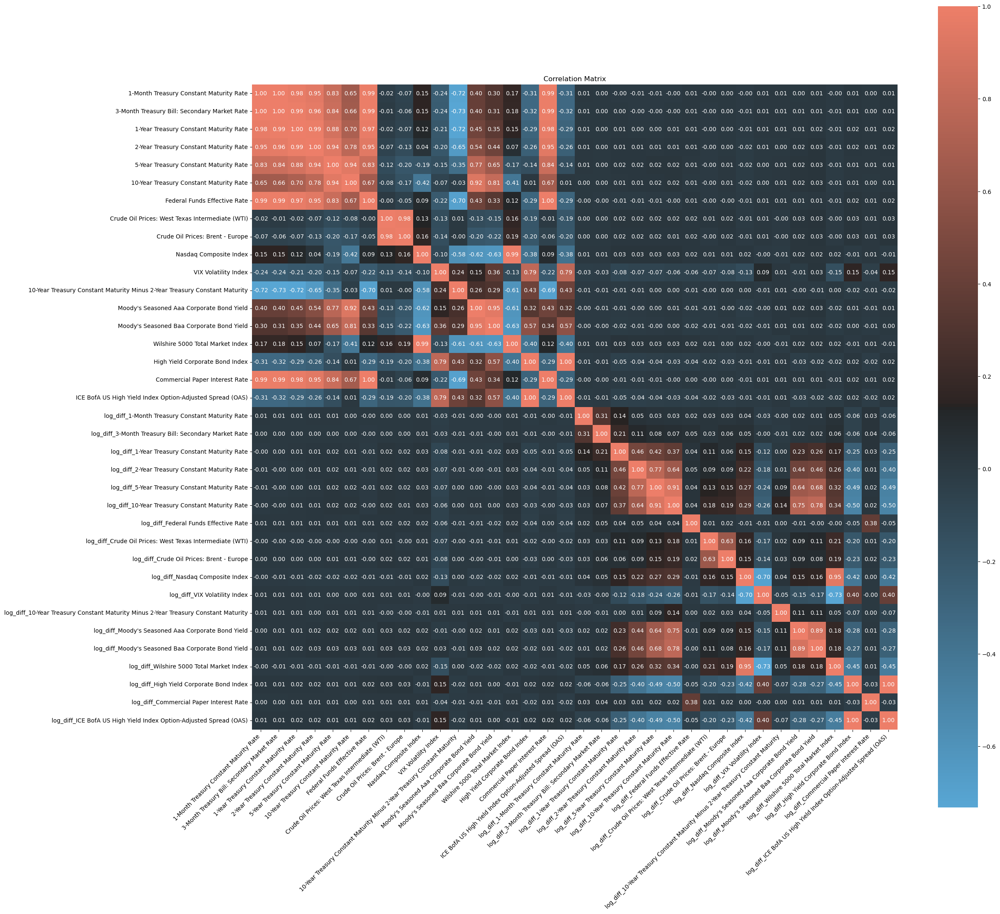

In [25]:
plot_corr_matrix(df_daily_clean) #open in new page to see the image better, zeros can 

In [26]:
### Find highest correlating variables

def find_high_correlations(df, target_variable):

    correlation_matrix = df.corr()
    correlations = correlation_matrix[target_variable].drop(target_variable)

    # filter out perfect correlations of 1 or -1
    filtered_correlations = correlations[(correlations < 1) & (correlations > -1)]

    #get the top n variables with the highest positive correlation (taking abs)
    top_positive_correlations = filtered_correlations.abs().nlargest(20)
    print("Top 20 positive correlated variables with '", target_variable, "' (excluding perfect correlations):")
    print(top_positive_correlations)

    #  get the top n variabls with the most negative correlation
    top_negative_correlations = filtered_correlations.nsmallest(20)
    print("Top 20 negative correlated variables with '", target_variable, "' (excluding perfect correlations):")
    print(top_negative_correlations)

    return top_positive_correlations, top_negative_correlations

top_vars = find_high_correlations(df_no_date, "Wilshire 5000 Total Market Index")

Top 20 positive correlated variables with ' Wilshire 5000 Total Market Index ' (excluding perfect correlations):
Nasdaq Composite Index                                                        0.994445
Moody's Seasoned Baa Corporate Bond Yield                                     0.628653
Moody's Seasoned Aaa Corporate Bond Yield                                     0.614773
10-Year Treasury Constant Maturity Minus 2-Year Treasury Constant Maturity    0.608349
10-Year Treasury Constant Maturity Rate                                       0.411269
ICE BofA US High Yield Index Option-Adjusted Spread (OAS)                     0.399348
High Yield Corporate Bond Index                                               0.399348
Crude Oil Prices: Brent - Europe                                              0.194304
3-Month Treasury Bill: Secondary Market Rate                                  0.176102
1-Month Treasury Constant Maturity Rate                                       0.172289
5-Year Treasury C

## 3.2 Stationarity testing

In our analysis of various financial indicators using Augmented Dickey-Fuller (ADF) tests, an interesting observation emerged: the original data for the VIX Volatility Index was found to be stationary, which is somewhat unusual as most economic time series data tend to show some form of non-stationarity due to underlying economic cycles, trends, or other factors https://www.projectguru.in/what-is-a-stationarity-test-how-to-do-it/

Understanding Stationarity:
Stationarity in a time series implies that the statistical properties of the series like mean, variance, and covariance do not change over time. Most financial time series, however, are non-stationary by nature, which can complicate modeling efforts because predictive models often assume data stationarity.

Non-Stationary Variables:
Our findings highlighted that a significant number of variables in their original forms were non-stationary, including:

Treasury Rates (1-year to 10-year)
Federal Funds Effective Rate
Crude Oil Prices: Brent - Europe
Nasdaq Composite Index
Moody's Corporate Bond Yields
Wilshire 5000 Total Market Index
High Yield Corporate Bond Index
Commercial Paper Interest Rate
ICE BofA US High Yield Index OAS
Non-stationarity in these variables isn't surprising given their sensitivity to underlying economic conditions, policy changes, and other external factors.

Transformed Variables Showing Stationarity:
Interestingly, when transformations such as logging and differencing were applied, most of the originally non-stationary variables achieved stationarity. This includes the transformed indices of treasury rates, federal rates, and even stock indices like the Nasdaq. This underscores the effectiveness of transformations in pre-processing financial time series data for analytical modeling and machine learning applications.

Special Mention - VIX Volatility Index:
The VIX Volatility Index was notably stationary even before transformation, which might indicate its properties as a measure of instantaneous market expectation of near-term volatility conveyed by stock index option prices.

Conclusion:
The prevalence of non-stationarity in raw financial time series data highlights the need for careful data preprocessing before employing these series in machine learning models, while for the Deep Reinforcement Learning models (DRL) the check on stationarity is not critical, as in theory the DRL should be able to catch the intricacies of data's statistical properties. The fact that transformations helped achieve stationarity across multiple series reassures that with proper techniques, we can adapt non-stationary financial data for consistent and effective analysis and modeling.

In [27]:
def check_stationarity(df):
    all_columns = df.columns.tolist()
    columns = [column for column in all_columns if not column.endswith("CCA") and not column.endswith("CHG") and not column.endswith("CCH") and not column.endswith("date")]

    stationary_columns = {}
    non_stationary_columns = {}

    for column in columns:
        #skip columns with zero or negative values
        if (df[column] <= 0).any():
            print(f"Skipping {column} due to zero or negative values")
            continue

        print(f"--- Processing column: {column} ---\n")

        #Rriginal ACF Plot
        plt.figure(figsize=(10, 4))
        plot_acf(df[column].dropna(), lags=20)
        plt.title(f"Autocorrelation Function (ACF) - {column}")
        plt.xlabel("Lags")
        plt.ylabel("ACF Value")
        plt.show()

        # ADF
        adftest = adfuller(df[column].dropna(), autolag="AIC", regression="ct")
        print("ADF Test Results for Original Data")
        print("Null Hypothesis: The series has a unit root (non-stationary)")
        print(f"ADF-Statistic: {adftest[0]}")
        print(f"P-Value: {adftest[1]}")
        print(f"Number of lags: {adftest[2]}")
        print(f"Number of observations: {adftest[3]}")
        print(f"Critical Values: {adftest[4]}")
        print("Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary\n")

        if adftest[1] < 0.05:
            print(f"{column} is stationary.")
            stationary_columns[column] = "stationary"
        else:
            print(f"{column} is non-stationary.")
            non_stationary_columns[column] = "non_stationary"

        # transformation: log first
        df_transformed = pd.DataFrame()
        df_transformed[f"{column}_logs"] = np.log(df[column].dropna())

        # delta
        df_transformed[f"{column}_diff"] = df_transformed[f"{column}_logs"].diff()

        # convert to growth rates (multiply by 100)
        df_transformed[f"{column}_growth"] = df_transformed[f"{column}_diff"] * 100

        # Plot ACF for transformed data
        plt.figure(figsize=(10, 4))
        plot_acf(df_transformed[f"{column}_growth"].dropna(), lags=20)
        plt.title(f"ACF for Transformed Data - {column}")
        plt.show()

        # ADF test on transformed data
        adftest_transformed = adfuller(df_transformed[f"{column}_growth"].dropna(), autolag='AIC', regression='ct')
        print("ADF Test Results for Transformed Data")
        print("Null Hypothesis: The series has a unit root")
        print(f"ADF-Statistic: {adftest_transformed[0]}")
        print(f"P-Value: {adftest_transformed[1]}")
        print(f"Number of lags: {adftest_transformed[2]}")
        print(f"Number of observations: {adftest_transformed[3]}")
        print(f"Critical Values: {adftest_transformed[4]}")
        print("Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary\n")

        transformed_column_name = f"{column}_transformed"
        if adftest_transformed[1] < 0.05:
            print(f"{transformed_column_name} is stationary.")
            stationary_columns[transformed_column_name] = "stationary"
        else:
            print(f"{transformed_column_name} is non-stationary.")
            non_stationary_columns[transformed_column_name] = "non_stationary"
        print("\n" + "-"*80 + "\n")

        # final plot
        df_transformed[f"{column}_growth"].plot(figsize=(10, 5), grid=True)
        plt.title(f"Transformed Data Plot - {column}")
        plt.show()
    return stationary_columns, non_stationary_columns


Skipping 1-Month Treasury Constant Maturity Rate due to zero or negative values
Skipping 3-Month Treasury Bill: Secondary Market Rate due to zero or negative values
--- Processing column: 1-Year Treasury Constant Maturity Rate ---



<Figure size 1000x400 with 0 Axes>

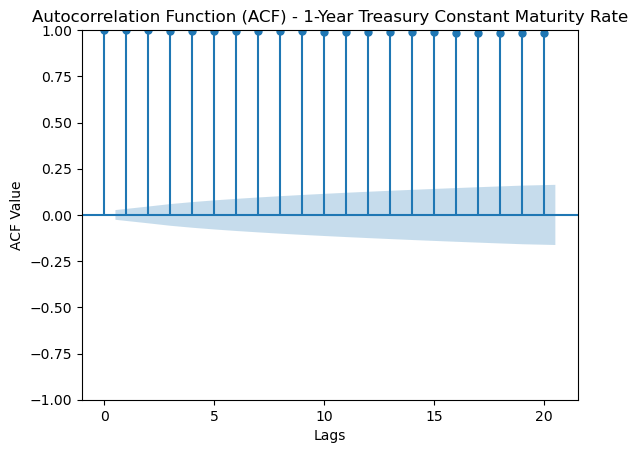

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -0.5824461676792596
P-Value: 0.9798249628566269
Number of lags: 30
Number of observations: 5530
Critical Values: {'1%': -3.9604080190007322, '5%': -3.4112842197974897, '10%': -3.1275176872507684}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

1-Year Treasury Constant Maturity Rate is non-stationary.


<Figure size 1000x400 with 0 Axes>

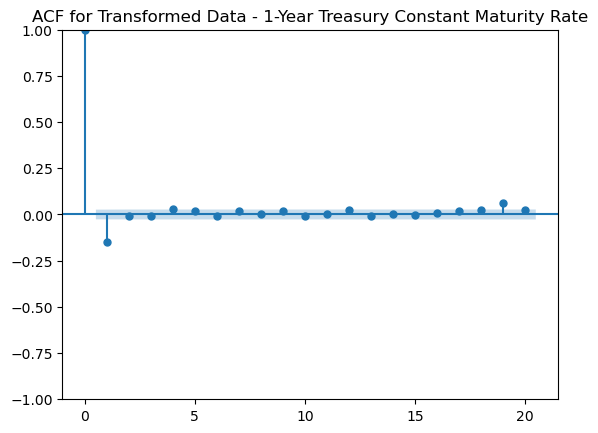

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -11.597087961717065
P-Value: 1.821224394734371e-18
Number of lags: 30
Number of observations: 5529
Critical Values: {'1%': -3.960408315428722, '5%': -3.4112843634972307, '10%': -3.12751777186207}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

1-Year Treasury Constant Maturity Rate_transformed is stationary.

--------------------------------------------------------------------------------



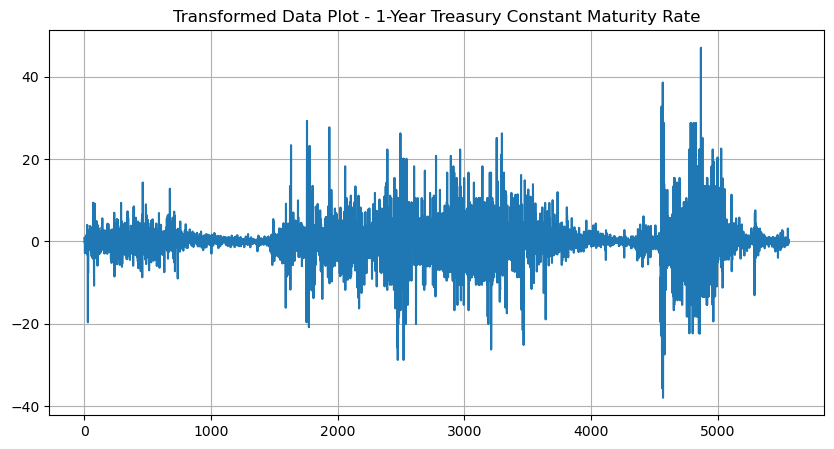

--- Processing column: 2-Year Treasury Constant Maturity Rate ---



<Figure size 1000x400 with 0 Axes>

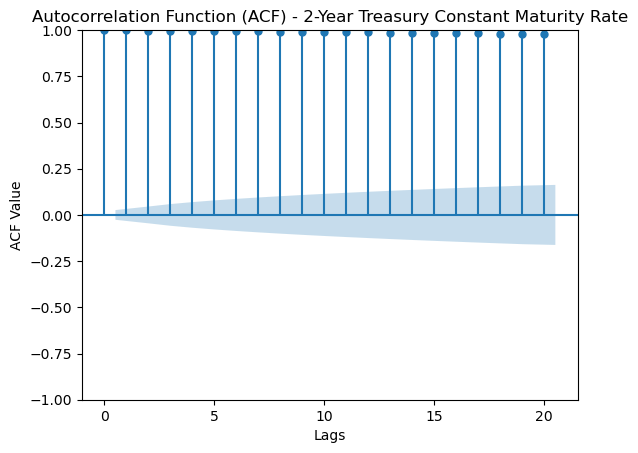

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -0.6167607036800747
P-Value: 0.9780792825638096
Number of lags: 33
Number of observations: 5527
Critical Values: {'1%': -3.960408908606681, '5%': -3.4112846510527675, '10%': -3.127517941176551}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

2-Year Treasury Constant Maturity Rate is non-stationary.


<Figure size 1000x400 with 0 Axes>

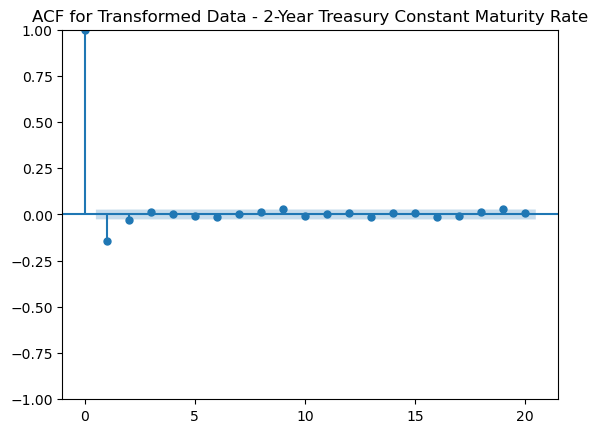

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -59.49164701001387
P-Value: 0.0
Number of lags: 1
Number of observations: 5558
Critical Values: {'1%': -3.9603997623483793, '5%': -3.411280217206457, '10%': -3.1275153304990555}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

2-Year Treasury Constant Maturity Rate_transformed is stationary.

--------------------------------------------------------------------------------



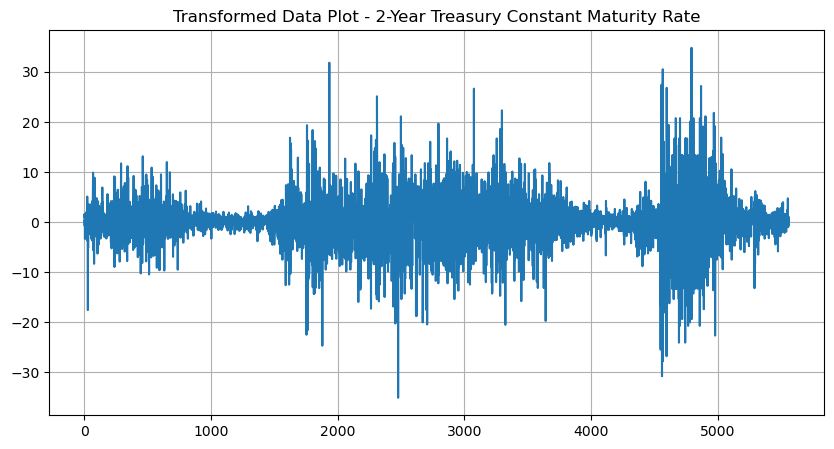

--- Processing column: 5-Year Treasury Constant Maturity Rate ---



<Figure size 1000x400 with 0 Axes>

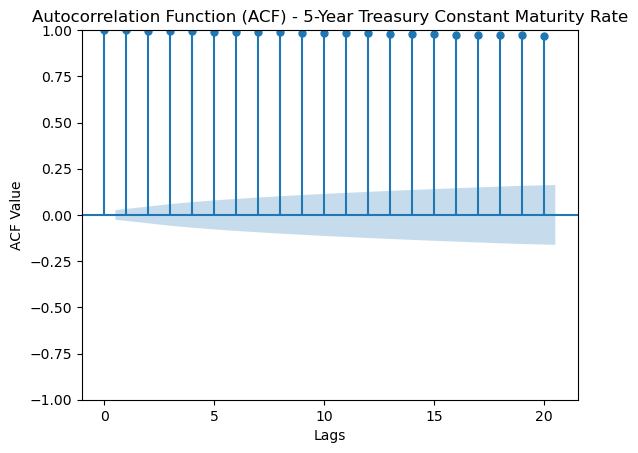

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -1.0024261136677055
P-Value: 0.9437872739150948
Number of lags: 2
Number of observations: 5558
Critical Values: {'1%': -3.9603997623483793, '5%': -3.411280217206457, '10%': -3.1275153304990555}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

5-Year Treasury Constant Maturity Rate is non-stationary.


<Figure size 1000x400 with 0 Axes>

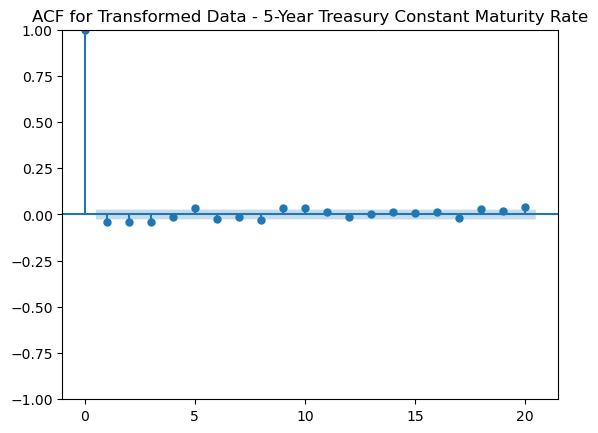

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -12.275585952968344
P-Value: 1.4165461244140747e-19
Number of lags: 33
Number of observations: 5526
Critical Values: {'1%': -3.9604092053567665, '5%': -3.4112847949086205, '10%': -3.1275180258797635}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

5-Year Treasury Constant Maturity Rate_transformed is stationary.

--------------------------------------------------------------------------------



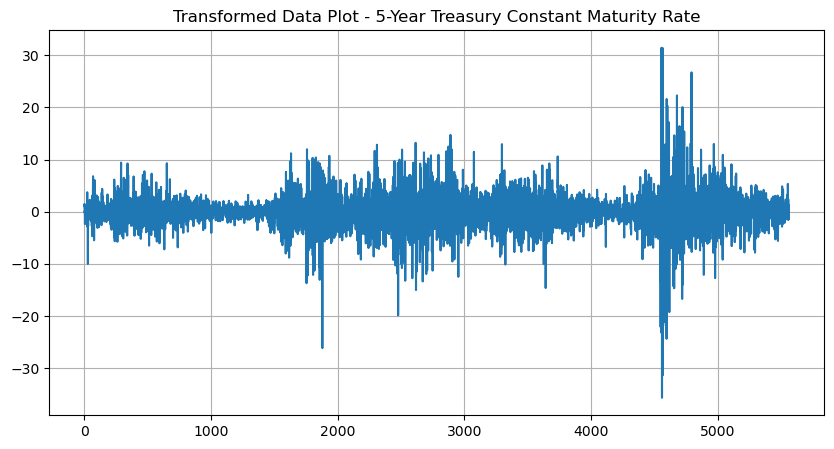

--- Processing column: 10-Year Treasury Constant Maturity Rate ---



<Figure size 1000x400 with 0 Axes>

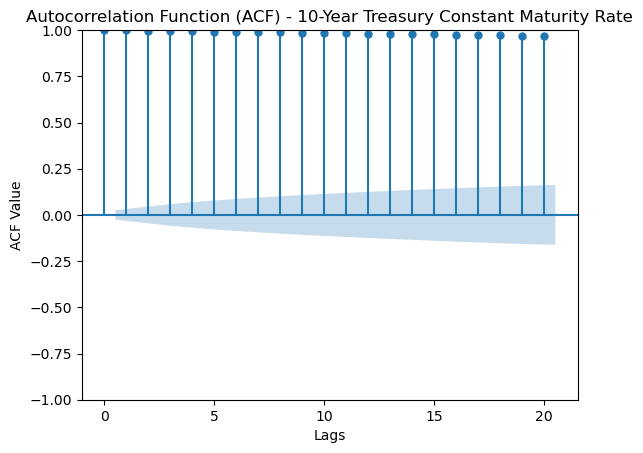

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -1.3304403034342251
P-Value: 0.8801929036398051
Number of lags: 2
Number of observations: 5558
Critical Values: {'1%': -3.9603997623483793, '5%': -3.411280217206457, '10%': -3.1275153304990555}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

10-Year Treasury Constant Maturity Rate is non-stationary.


<Figure size 1000x400 with 0 Axes>

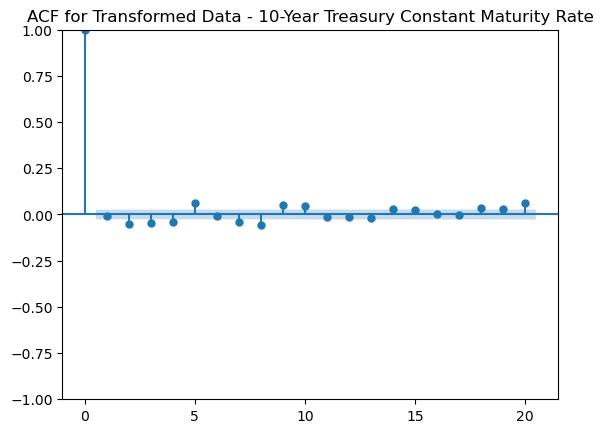

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -12.160842714336512
P-Value: 2.1314191711772341e-19
Number of lags: 32
Number of observations: 5527
Critical Values: {'1%': -3.960408908606681, '5%': -3.4112846510527675, '10%': -3.127517941176551}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

10-Year Treasury Constant Maturity Rate_transformed is stationary.

--------------------------------------------------------------------------------



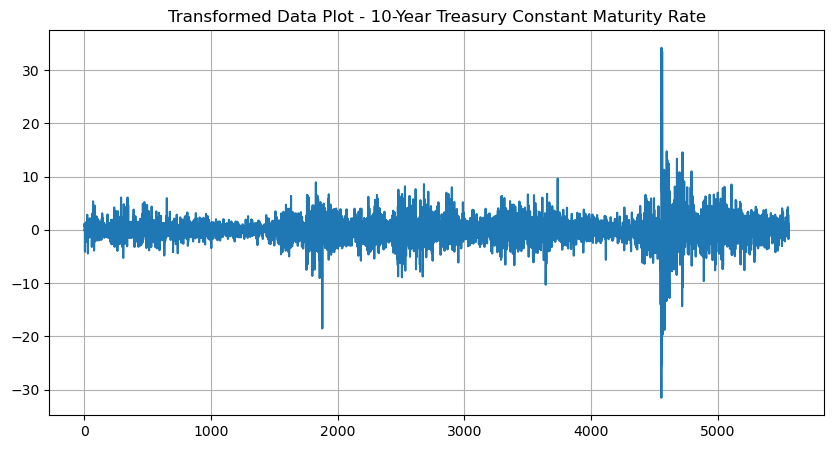

--- Processing column: Federal Funds Effective Rate ---



<Figure size 1000x400 with 0 Axes>

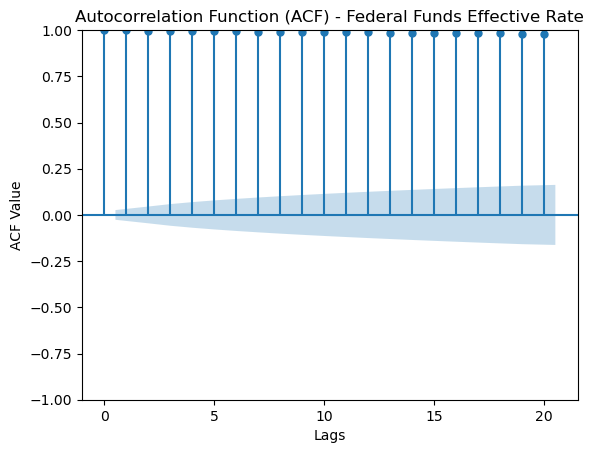

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -0.40343664381153327
P-Value: 0.9867752027545095
Number of lags: 33
Number of observations: 5527
Critical Values: {'1%': -3.960408908606681, '5%': -3.4112846510527675, '10%': -3.127517941176551}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Federal Funds Effective Rate is non-stationary.


<Figure size 1000x400 with 0 Axes>

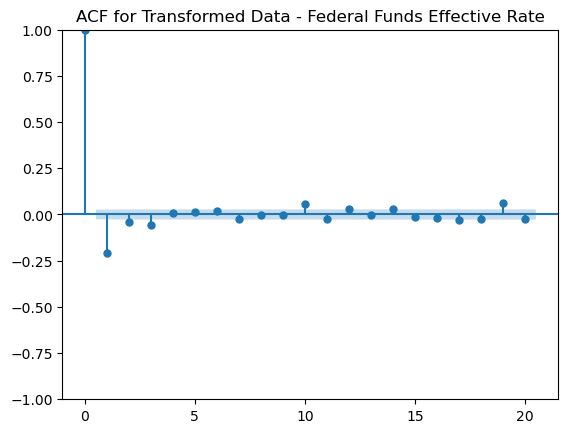

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -14.902741568711539
P-Value: 2.454292974214803e-22
Number of lags: 21
Number of observations: 5538
Critical Values: {'1%': -3.960405651432887, '5%': -3.4112830720685126, '10%': -3.127517011460696}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Federal Funds Effective Rate_transformed is stationary.

--------------------------------------------------------------------------------



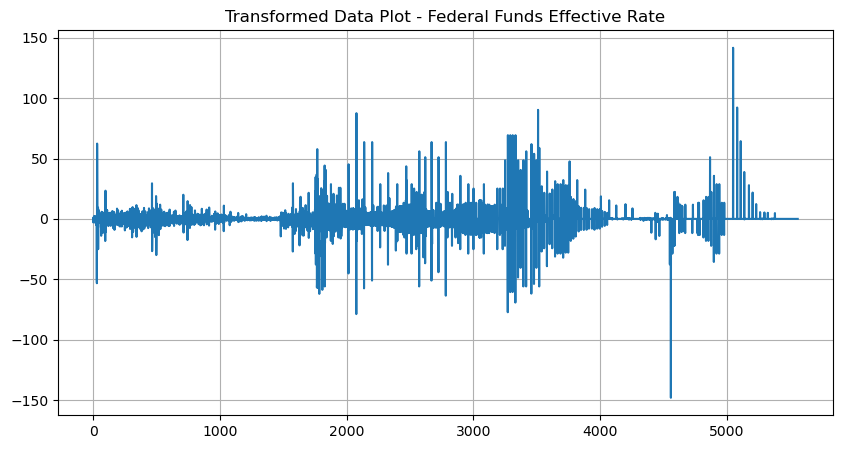

Skipping Crude Oil Prices: West Texas Intermediate (WTI) due to zero or negative values
--- Processing column: Crude Oil Prices: Brent - Europe ---



<Figure size 1000x400 with 0 Axes>

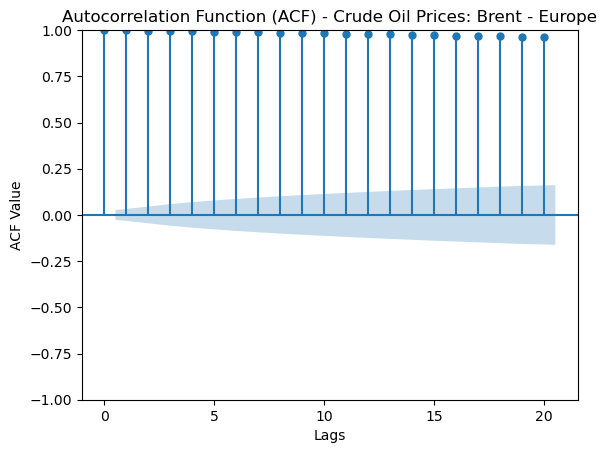

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -2.583469707746096
P-Value: 0.28755970145793674
Number of lags: 16
Number of observations: 5544
Critical Values: {'1%': -3.9604038802435766, '5%': -3.411282213446317, '10%': -3.1275165058983987}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Crude Oil Prices: Brent - Europe is non-stationary.


<Figure size 1000x400 with 0 Axes>

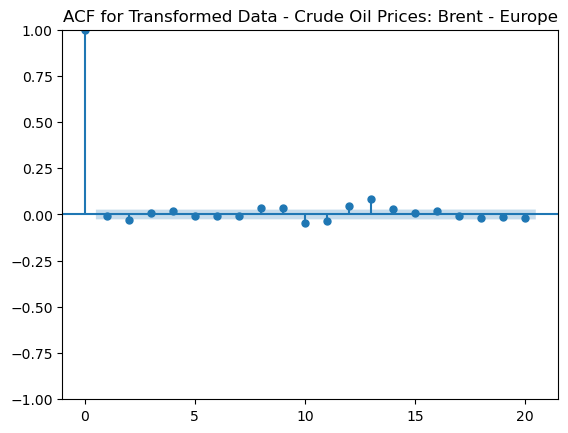

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -12.829931699686787
P-Value: 2.2693817886066318e-20
Number of lags: 33
Number of observations: 5526
Critical Values: {'1%': -3.9604092053567665, '5%': -3.4112847949086205, '10%': -3.1275180258797635}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Crude Oil Prices: Brent - Europe_transformed is stationary.

--------------------------------------------------------------------------------



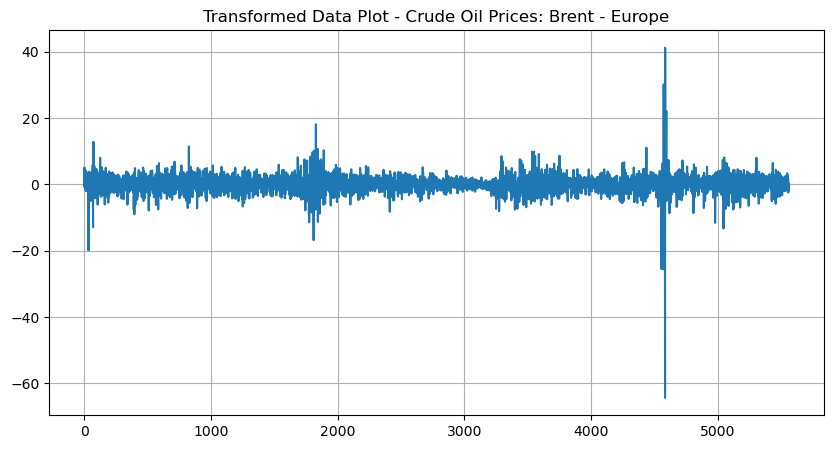

--- Processing column: Nasdaq Composite Index ---



<Figure size 1000x400 with 0 Axes>

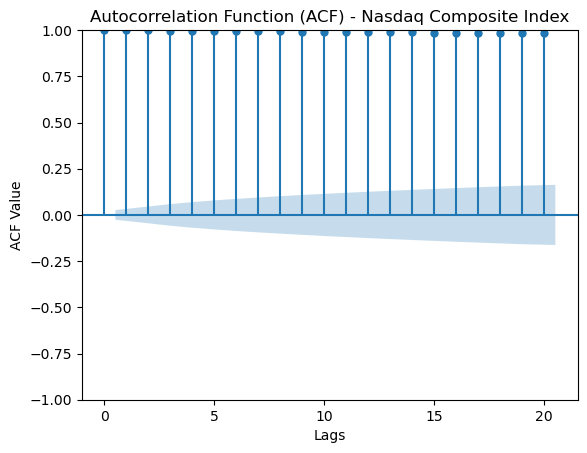

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -1.1074307109161923
P-Value: 0.9278147836377323
Number of lags: 32
Number of observations: 5528
Critical Values: {'1%': -3.9604086119640187, '5%': -3.4112845072489804, '10%': -3.127517856503992}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Nasdaq Composite Index is non-stationary.


<Figure size 1000x400 with 0 Axes>

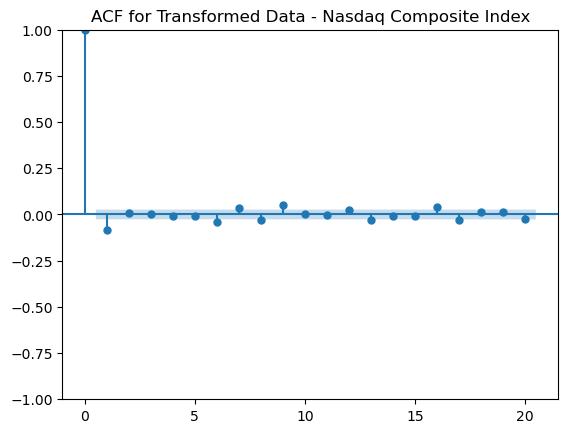

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -13.98791148134077
P-Value: 1.1252983331232258e-21
Number of lags: 31
Number of observations: 5528
Critical Values: {'1%': -3.9604086119640187, '5%': -3.4112845072489804, '10%': -3.127517856503992}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Nasdaq Composite Index_transformed is stationary.

--------------------------------------------------------------------------------



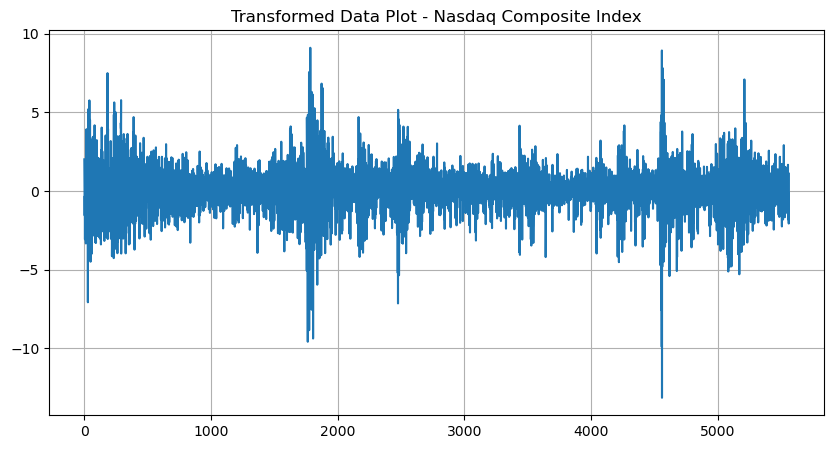

--- Processing column: VIX Volatility Index ---



<Figure size 1000x400 with 0 Axes>

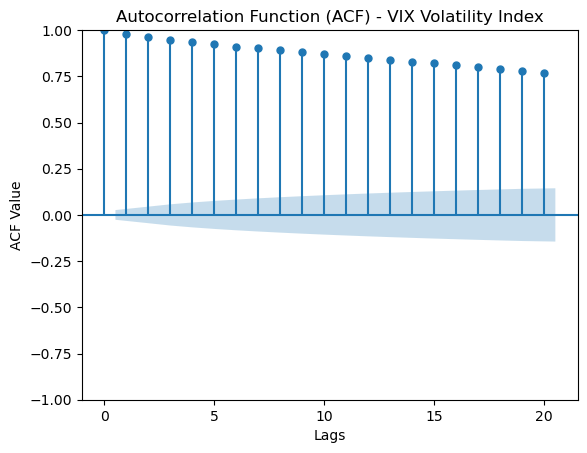

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -5.744956157768899
P-Value: 7.4182145549896145e-06
Number of lags: 10
Number of observations: 5550
Critical Values: {'1%': -3.960402112886034, '5%': -3.411281356681292, '10%': -3.1275160014295085}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

VIX Volatility Index is stationary.


<Figure size 1000x400 with 0 Axes>

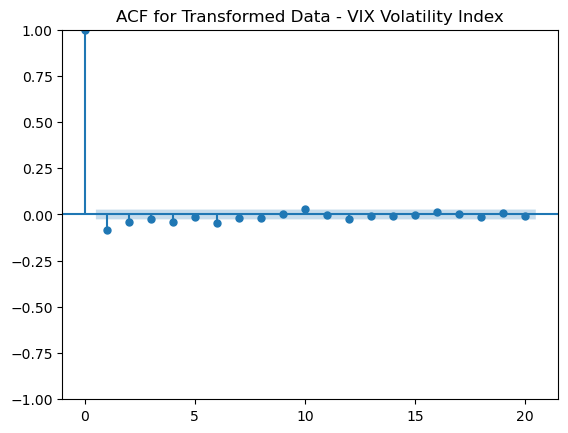

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -31.3027183945285
P-Value: 0.0
Number of lags: 7
Number of observations: 5552
Critical Values: {'1%': -3.960401524616209, '5%': -3.4112810715046136, '10%': -3.1275158335155786}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

VIX Volatility Index_transformed is stationary.

--------------------------------------------------------------------------------



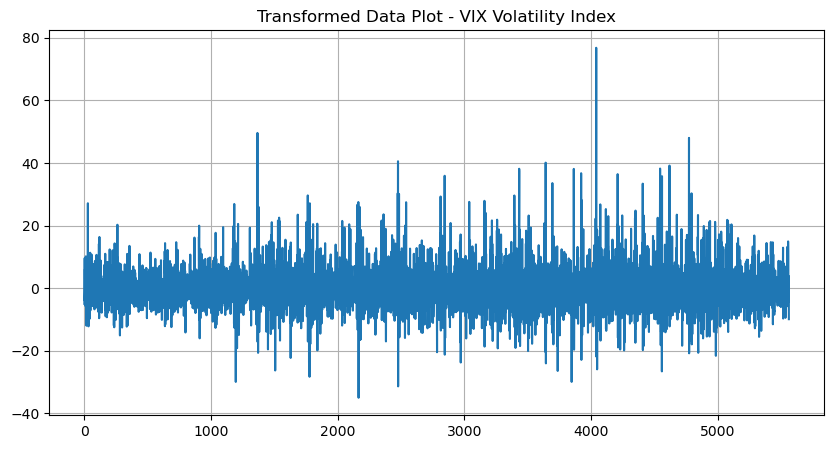

Skipping 10-Year Treasury Constant Maturity Minus 2-Year Treasury Constant Maturity due to zero or negative values
--- Processing column: Moody's Seasoned Aaa Corporate Bond Yield ---



<Figure size 1000x400 with 0 Axes>

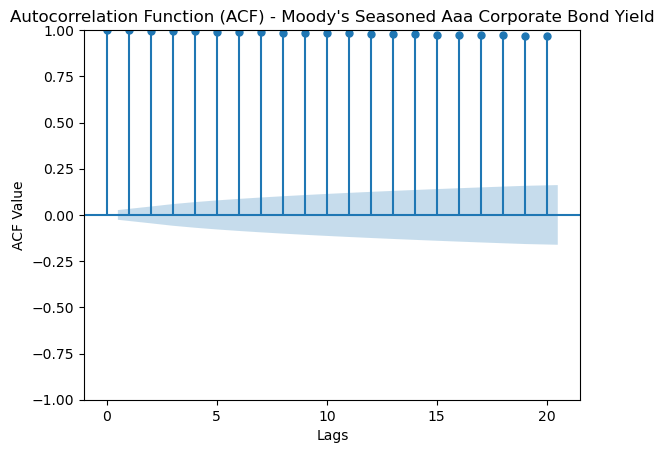

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -2.148059475536523
P-Value: 0.5191016896125524
Number of lags: 4
Number of observations: 5556
Critical Values: {'1%': -3.9604003493478395, '5%': -3.411280501767418, '10%': -3.1275154980504825}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Moody's Seasoned Aaa Corporate Bond Yield is non-stationary.


<Figure size 1000x400 with 0 Axes>

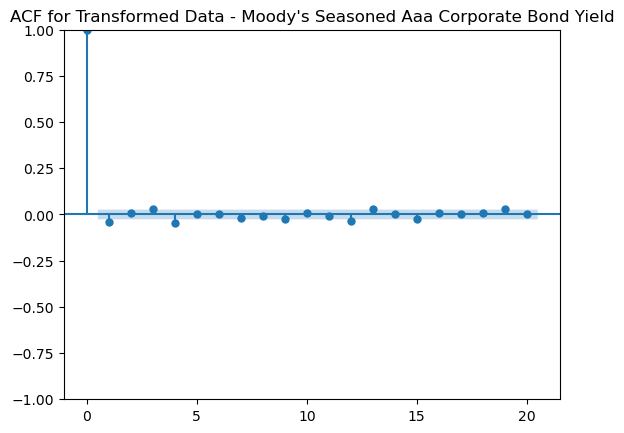

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -13.876487964459672
P-Value: 1.4277970515002467e-21
Number of lags: 31
Number of observations: 5528
Critical Values: {'1%': -3.9604086119640187, '5%': -3.4112845072489804, '10%': -3.127517856503992}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Moody's Seasoned Aaa Corporate Bond Yield_transformed is stationary.

--------------------------------------------------------------------------------



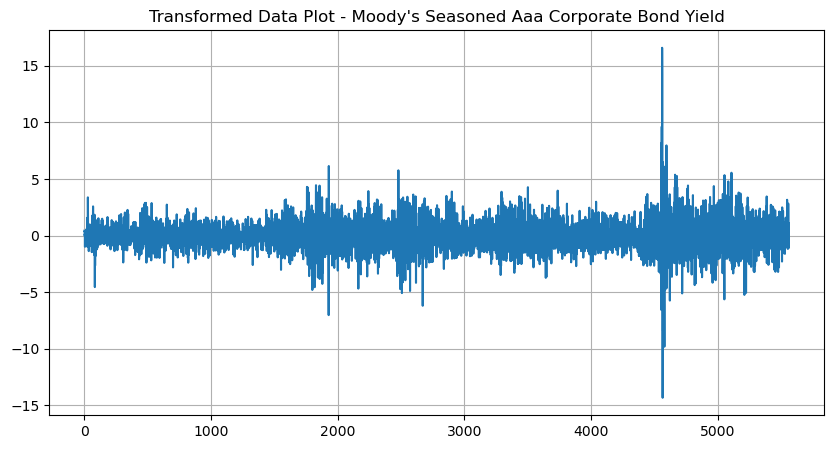

--- Processing column: Moody's Seasoned Baa Corporate Bond Yield ---



<Figure size 1000x400 with 0 Axes>

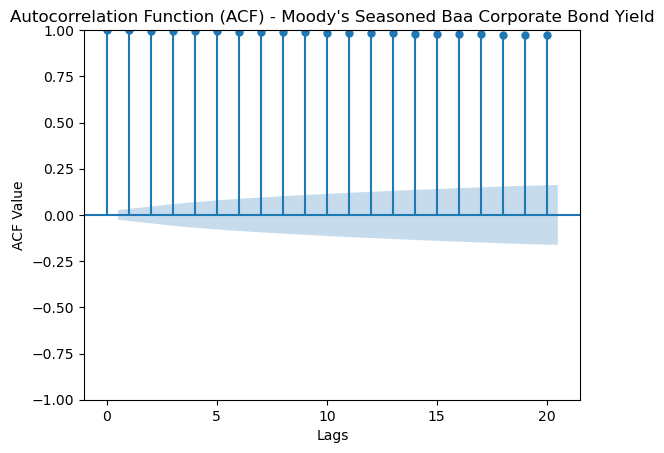

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -1.9221845282829555
P-Value: 0.6430969303911672
Number of lags: 3
Number of observations: 5557
Critical Values: {'1%': -3.960400055795263, '5%': -3.411280359461324, '10%': -3.1275154142596895}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Moody's Seasoned Baa Corporate Bond Yield is non-stationary.


<Figure size 1000x400 with 0 Axes>

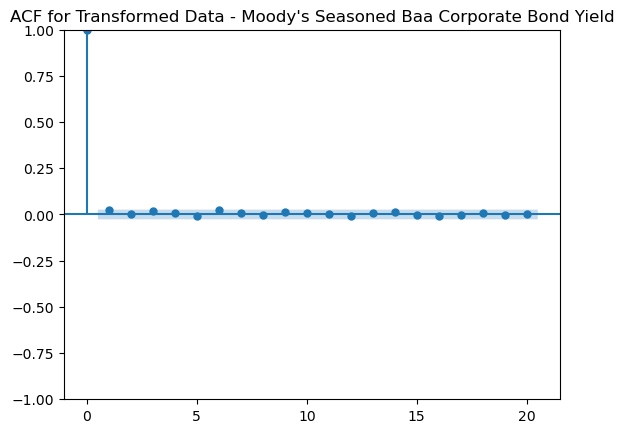

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -72.8878135908077
P-Value: 0.0
Number of lags: 0
Number of observations: 5559
Critical Values: {'1%': -3.9603994690071302, '5%': -3.4112800750027885, '10%': -3.1275152467685654}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Moody's Seasoned Baa Corporate Bond Yield_transformed is stationary.

--------------------------------------------------------------------------------



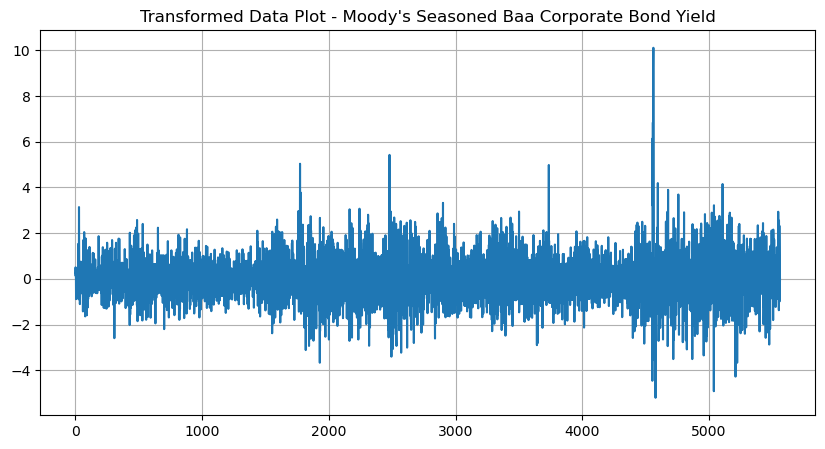

--- Processing column: Wilshire 5000 Total Market Index ---



<Figure size 1000x400 with 0 Axes>

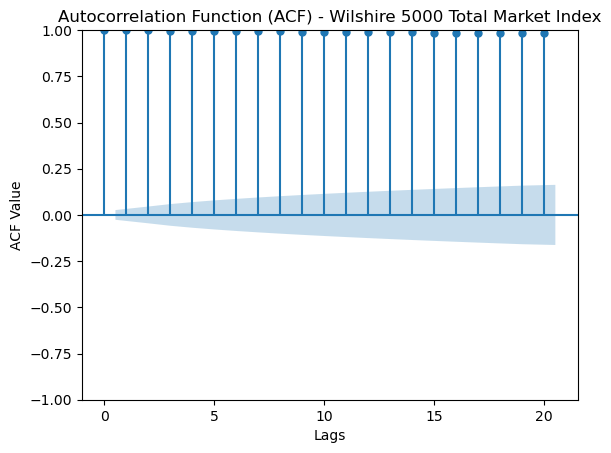

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -0.7752317745237489
P-Value: 0.9677072116022752
Number of lags: 30
Number of observations: 5530
Critical Values: {'1%': -3.9604080190007322, '5%': -3.4112842197974897, '10%': -3.1275176872507684}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Wilshire 5000 Total Market Index is non-stationary.


<Figure size 1000x400 with 0 Axes>

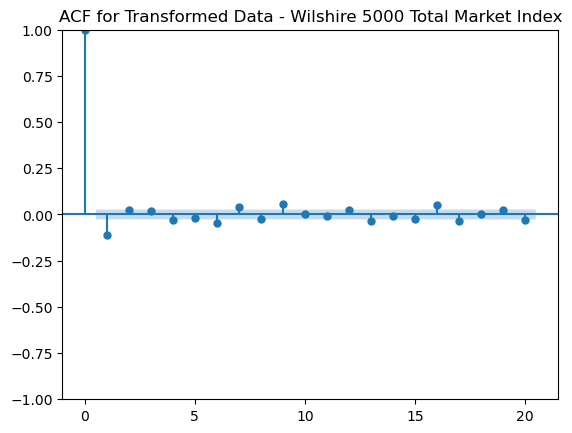

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -14.17878973888238
P-Value: 7.682369224454591e-22
Number of lags: 31
Number of observations: 5528
Critical Values: {'1%': -3.9604086119640187, '5%': -3.4112845072489804, '10%': -3.127517856503992}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Wilshire 5000 Total Market Index_transformed is stationary.

--------------------------------------------------------------------------------



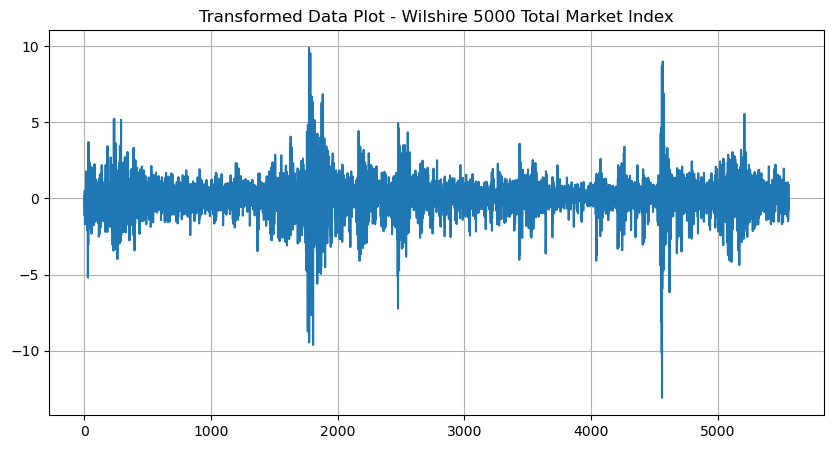

--- Processing column: High Yield Corporate Bond Index ---



<Figure size 1000x400 with 0 Axes>

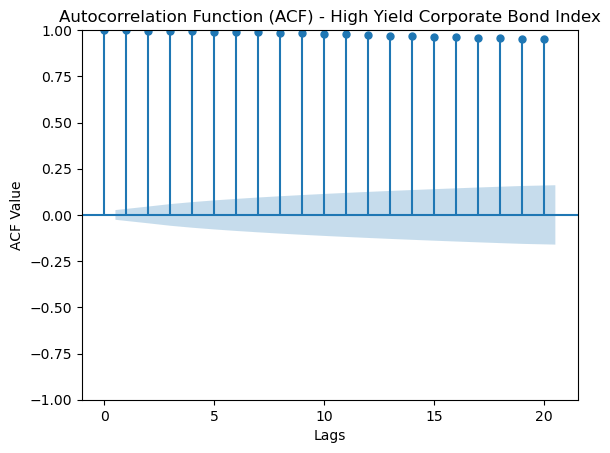

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -3.3169759362728355
P-Value: 0.06350894486066402
Number of lags: 27
Number of observations: 5533
Critical Values: {'1%': -3.960407130360023, '5%': -3.411283789010041, '10%': -3.1275174336004192}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

High Yield Corporate Bond Index is non-stationary.


<Figure size 1000x400 with 0 Axes>

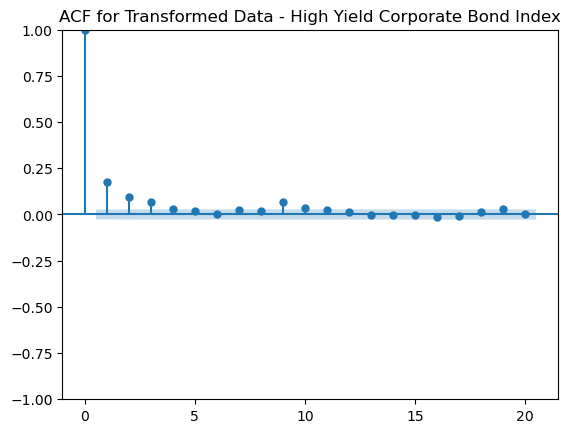

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -21.39147155225781
P-Value: 0.0
Number of lags: 8
Number of observations: 5551
Critical Values: {'1%': -3.960401818698104, '5%': -3.411281214067256, '10%': -3.1275159174574148}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

High Yield Corporate Bond Index_transformed is stationary.

--------------------------------------------------------------------------------



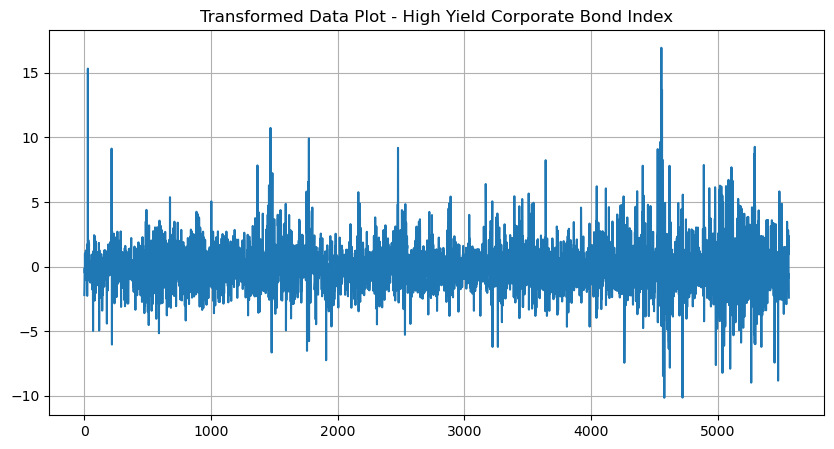

--- Processing column: Commercial Paper Interest Rate ---



<Figure size 1000x400 with 0 Axes>

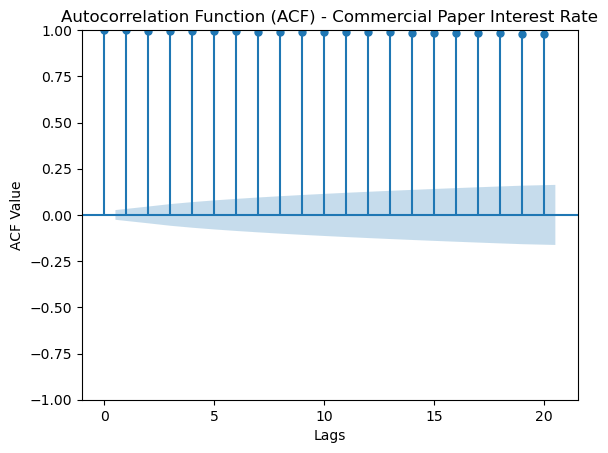

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -0.21794780174279624
P-Value: 0.9912093709555557
Number of lags: 33
Number of observations: 5527
Critical Values: {'1%': -3.960408908606681, '5%': -3.4112846510527675, '10%': -3.127517941176551}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Commercial Paper Interest Rate is non-stationary.


<Figure size 1000x400 with 0 Axes>

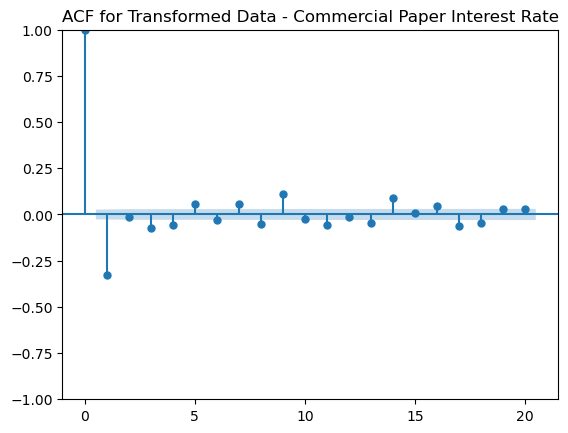

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -13.724088490081343
P-Value: 2.0133453914756845e-21
Number of lags: 27
Number of observations: 5532
Critical Values: {'1%': -3.960407426466441, '5%': -3.411283932553923, '10%': -3.1275175181199595}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

Commercial Paper Interest Rate_transformed is stationary.

--------------------------------------------------------------------------------



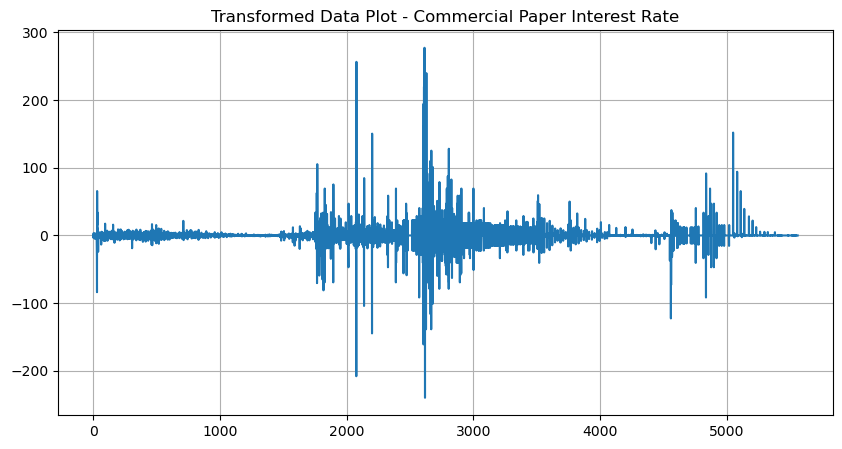

--- Processing column: ICE BofA US High Yield Index Option-Adjusted Spread (OAS) ---



<Figure size 1000x400 with 0 Axes>

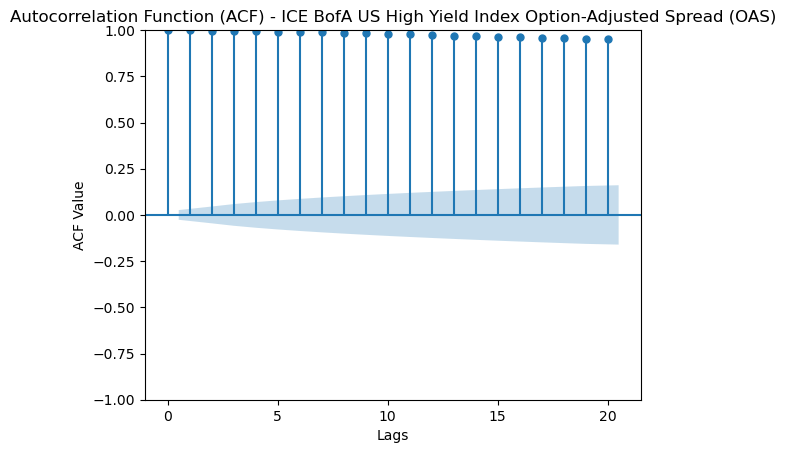

ADF Test Results for Original Data
Null Hypothesis: The series has a unit root (non-stationary)
ADF-Statistic: -3.3169759362728355
P-Value: 0.06350894486066402
Number of lags: 27
Number of observations: 5533
Critical Values: {'1%': -3.960407130360023, '5%': -3.411283789010041, '10%': -3.1275174336004192}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

ICE BofA US High Yield Index Option-Adjusted Spread (OAS) is non-stationary.


<Figure size 1000x400 with 0 Axes>

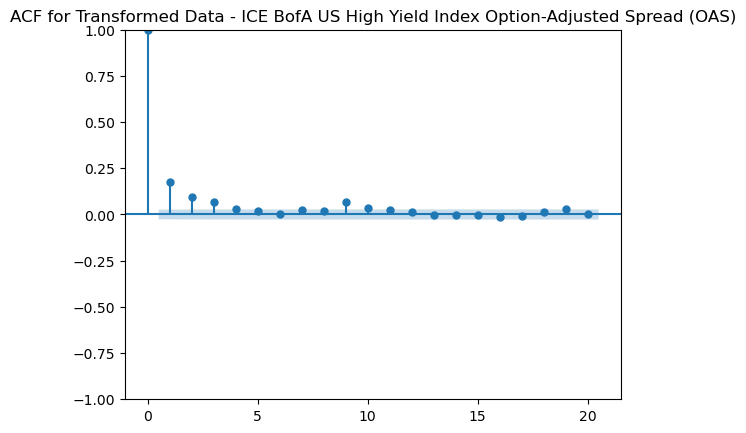

ADF Test Results for Transformed Data
Null Hypothesis: The series has a unit root
ADF-Statistic: -21.39147155225781
P-Value: 0.0
Number of lags: 8
Number of observations: 5551
Critical Values: {'1%': -3.960401818698104, '5%': -3.411281214067256, '10%': -3.1275159174574148}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary

ICE BofA US High Yield Index Option-Adjusted Spread (OAS)_transformed is stationary.

--------------------------------------------------------------------------------



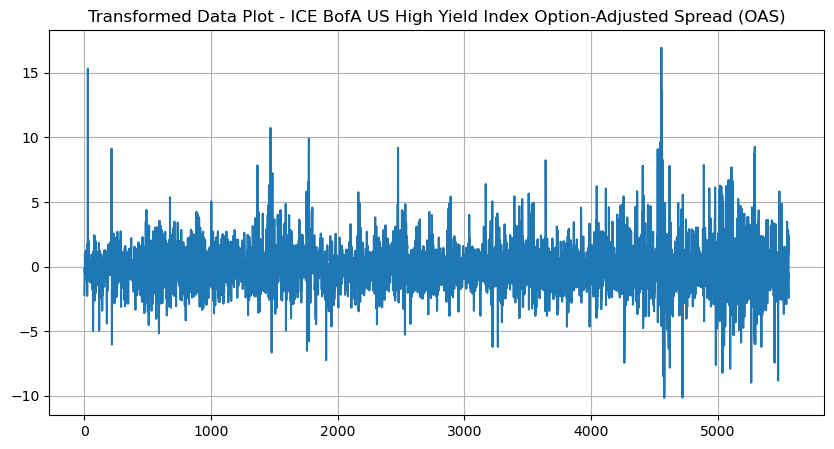

In [28]:
stationary_columns, non_stationary_columns = check_stationarity(df_daily_clean)

In [29]:
non_stationary_columns


{'1-Year Treasury Constant Maturity Rate': 'non_stationary',
 '2-Year Treasury Constant Maturity Rate': 'non_stationary',
 '5-Year Treasury Constant Maturity Rate': 'non_stationary',
 '10-Year Treasury Constant Maturity Rate': 'non_stationary',
 'Federal Funds Effective Rate': 'non_stationary',
 'Crude Oil Prices: Brent - Europe': 'non_stationary',
 'Nasdaq Composite Index': 'non_stationary',
 "Moody's Seasoned Aaa Corporate Bond Yield": 'non_stationary',
 "Moody's Seasoned Baa Corporate Bond Yield": 'non_stationary',
 'Wilshire 5000 Total Market Index': 'non_stationary',
 'High Yield Corporate Bond Index': 'non_stationary',
 'Commercial Paper Interest Rate': 'non_stationary',
 'ICE BofA US High Yield Index Option-Adjusted Spread (OAS)': 'non_stationary'}

In [30]:
stationary_columns

{'1-Year Treasury Constant Maturity Rate_transformed': 'stationary',
 '2-Year Treasury Constant Maturity Rate_transformed': 'stationary',
 '5-Year Treasury Constant Maturity Rate_transformed': 'stationary',
 '10-Year Treasury Constant Maturity Rate_transformed': 'stationary',
 'Federal Funds Effective Rate_transformed': 'stationary',
 'Crude Oil Prices: Brent - Europe_transformed': 'stationary',
 'Nasdaq Composite Index_transformed': 'stationary',
 'VIX Volatility Index': 'stationary',
 'VIX Volatility Index_transformed': 'stationary',
 "Moody's Seasoned Aaa Corporate Bond Yield_transformed": 'stationary',
 "Moody's Seasoned Baa Corporate Bond Yield_transformed": 'stationary',
 'Wilshire 5000 Total Market Index_transformed': 'stationary',
 'High Yield Corporate Bond Index_transformed': 'stationary',
 'Commercial Paper Interest Rate_transformed': 'stationary',
 'ICE BofA US High Yield Index Option-Adjusted Spread (OAS)_transformed': 'stationary'}

# 3.3 Multicolinearity

The Variance Inflation Factor (VIF) is used to investigate if multicolinearity is present in the dataset. This test checks if the dataset's variables are correlated amongst one another. This can become a problem because it undermines the statistical significance of an independent variable. When variables are correlated, it becomes hard to isolate the relationship between each predictor and the dependent variable, as changes in one predictor may be associated with another. This makes it had to determine the exact effect each predictor has on the dependent variable. Additionally, multicollinearity can lead to overfitting where the model performs well on training data but poorly on unseen data (https://www.mdpi.com/2227-7390/10/8/1283)

High VIF Values (Greater than 10): most of the treasury rate features (1-month, 3-month, 1-year, 2-year, 5-year, 10-year, and the Federal Funds Effective Rate) have VIF values well above 10, indicating they are likely explaining similar variances within the dataset, hence they are highly collinear. This is expected as these rates are typically correlated in financial data.

Infinite VIF (inf): this suggests perfect or near-perfect multicollinearity. The variables with an infinite VIF are linear combinations of each other or have a very strong association (we see this because the 10y and 2y rates and the margin of the too are lineary correlated, as well as I have a small mistake that High Yield Corporate Bond Index and the BofA bond index are essentially the same datasets, I chose to keep it inside due to sanity checks).

Moderate to High VIF Values: Moody's corporate bond yields and both crude oil prices, the VIF values are also above the threshold, indicating multicollinearity concerns, though not as extreme as the treasury rates.

Low VIF Values:Nasdaq Composite Index and the VIX Volatility Index have low VIF values, which implies they are fairly independent of the other variables in the model and do not have multicollinearity issues.

Future steps to address the multicollinearity can be done by (out of scope for current project):
- To remove the highly correlated predictors (especially if the variables are higly correlated but do not explain a lot of variance)
- Use the correlated predictors to create a new variable (i.e. using Principal Component analysis, other combination techniques depending on the context)
- Reguliarization techniques, such as Ridge Regression or Lasso Regression, which add a penalty to the model for having large coefficients for predictors, effectively shrinking coefficients and reducing the impact of multicollinearity
- Increasing the sample size because sometimes larger size may assist with multicollinearity   

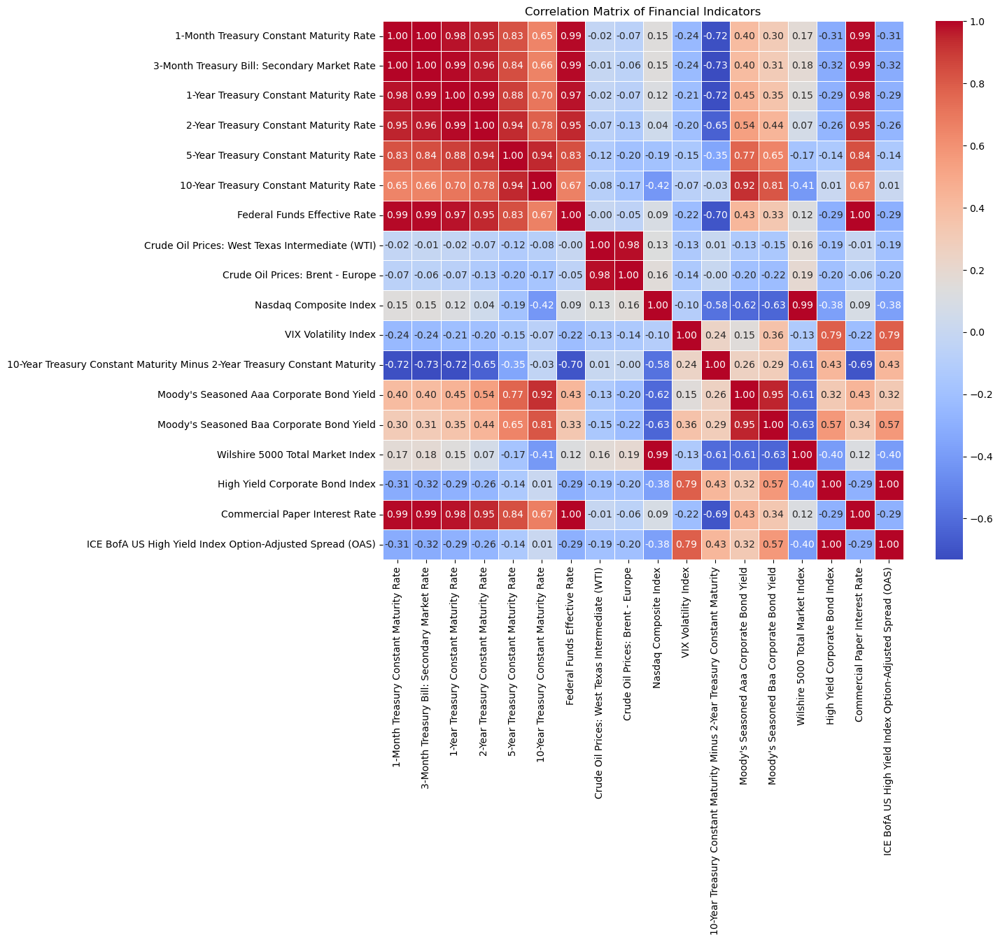

                                              feature          VIF
0             1-Month Treasury Constant Maturity Rate   231.149062
1        3-Month Treasury Bill: Secondary Market Rate   622.263572
2              1-Year Treasury Constant Maturity Rate   817.491661
3              2-Year Treasury Constant Maturity Rate          inf
4              5-Year Treasury Constant Maturity Rate   356.431277
5             10-Year Treasury Constant Maturity Rate          inf
6                        Federal Funds Effective Rate  1032.737664
7     Crude Oil Prices: West Texas Intermediate (WTI)    40.954788
8                    Crude Oil Prices: Brent - Europe    42.423613
9                              Nasdaq Composite Index     3.476294
10                               VIX Volatility Index     3.311466
11  10-Year Treasury Constant Maturity Minus 2-Yea...          inf
12          Moody's Seasoned Aaa Corporate Bond Yield    68.873670
13          Moody's Seasoned Baa Corporate Bond Yield   111.14

c:\Users\augus\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


In [31]:
def VIF_multicollinearity_test(df):
    #calculate the pairwise correlation matrix

    df = df.drop(columns='date', errors='ignore')

    correlation_matrix = df.corr()

    #plot the correlation matrix
    plt.figure(figsize=(12, 10))
    sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
    plt.title('Correlation Matrix of Financial Indicators')
    plt.show()

    # ensure all data is numeric and finite
    df = df.apply(pd.to_numeric, errors='coerce')
    df = df.dropna().replace([np.inf, -np.inf], np.nan).dropna()

    # select only predictor variables
    predictor_variables = df.columns.drop('Wilshire 5000 Total Market Index')  # Adjust column name as necessary 

    # initialize DataFrame to store VIF scores
    vif_data = pd.DataFrame()
    vif_data["feature"] = predictor_variables

    # add a constant column for VIF calculation, it represents the intercept
    df_vif = df[predictor_variables]
    df_vif = df_vif.assign(intercept=1)

    # calculate VIF for each feature that's a potential predictor
    vif_data["VIF"] = [variance_inflation_factor(df_vif.values, i) for i in range(df_vif.shape[1] - 1)]  # exclude intercept

    # Display the VIF scores
    print(vif_data)

VIF_multicollinearity_test(df_standardized) # we want to use the standardized data because it helps to remove the unit scale and interpretation of VIF scores becomes more straightforward
                                            # potentially could of checked on the logarithmic deltas
                                            

# 3.4 Principal Component Analysis (PCA)

https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html

PCA is a statistical technique used for dimensionality reduction while preserving as much variability as possible. PCA transforms the original variables into a new set of variables called principal components, which are linear combinations of the original variables. These components are orthogonal (independent of one another) and ordered so that the first few retain most of the variation present in all of the original variables

We will apply it given PCA is able to address the multicollinearity issue present in our dataset.
 
#### Explained variace
Explained variance ratio indicates the proportion of the data's total variance that the Principle Component(PC) is able to explain. In our example, the 85% of variance can be explained by 3 PCs:

- PC1 - The first principal component accounts for 46% of the variance in the dataset. This suggests that nearly half of the variability in data can be explained by just this single component

- PC2 - 0.28, same logic as before

- PC3 - 0.11, same logic as before 


#### Composition of PCs

The describptive labels for each PC gices insight into which variables are most influential for each component (minimum +-0.33 threshold is set):

- PC1: this component is strongly influenced by various types of interest rates and financial indicators, such as Treasury rates and the Federal Funds Effective Rate. The positive signs indicate that these variables all move together; as one increases, the others tend to increase as well, contributing positively to PC1.

- PC2: this component shows a mix of stock market indexes and bond yields, with a negative sign for stock indexes like the Nasdaq Composite Index and the Wilshire 5000, and positive signs for bond-related measures. This suggests that PC2 captures contrasting movements between stock markets and bond yields, potentially reflecting market sentiment or economic conditions where bonds and stocks move inversely.

- PC3: dominated by negative loadings on crude oil prices (both WTI and Brent), this component might be capturing aspects of the data related to energy prices and their inverse movements with other variables in the dataset.

P.S. in the PCA we are still using the Wilshire5000 index, depending on the task at hand (supervised, unsupervised, mix, or reinforcement learning) the index would be removed or kept in the PCA. For the moment it is not removed

In [32]:
def perform_pca(df): #pass clean data only, not standardized
    # standardizing the data to have mean=0 and variance=1
    df = df.drop(columns='date', errors='ignore')
    scaler = StandardScaler()
    df_standardized = scaler.fit_transform(df)

    # applying PCA to reduce dimensions while capturing essential variance
    pca = PCA(n_components=3) 
    principal_components = pca.fit_transform(df_standardized)
    explained_variance_ratio = pca.explained_variance_ratio_

    # creating a df for principal componets with more descriptive naming
    components_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'], index=df.index)
    print("Principal Components Data:\n", components_df)

    # summarizing the explained variance
    print("\nExplained Variance Ratio per Principal Component:")
    for i, ratio in enumerate(explained_variance_ratio, 1):
        print(f"PC{i}: {ratio:.2f}")

    #creating a df for principal components loadings to understnd which varibles contribute to each component
    loadings_df = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2', 'PC3'], index=df.columns)

    # optionally, creating a more interpretive description of each component based on loadings
    def describe_component(component):
        strong_loadings = component[np.abs(component) > 0.33]  # threshold to consider srong loading
        descriptions = [f"{('+' if val > 0 else '-')}{col}" for col, val in strong_loadings.items()]
        return " + ".join(descriptions)

    component_descriptions = {f"PC{i + 1}": describe_component(loadings_df[f"PC{i + 1}"]) for i in range(3)}
    print("\nDescriptive Labels for Principal Components:")
    for pc, description in component_descriptions.items():
        print(f"{pc}: {description}")
    return components_df, loadings_df

components_df , loadings_df = perform_pca(df_daily_clean)


Principal Components Data:
            PC1       PC2       PC3
0     3.994072  3.580776  1.252894
1     4.037411  3.533495  1.172075
2     4.071980  3.514434  1.069167
3     4.068336  3.530161  1.045920
4     4.062716  3.591146  1.110291
...        ...       ...       ...
5556  6.024161 -2.690667  0.599160
5557  5.967768 -2.701317  0.703467
5558  6.030372 -2.651331  0.688826
5559  6.000455 -2.631215  0.696842
5560  6.017752 -2.720750  0.648889

[5561 rows x 3 columns]

Explained Variance Ratio per Principal Component:
PC1: 0.46
PC2: 0.28
PC3: 0.11

Descriptive Labels for Principal Components:
PC1: +1-Month Treasury Constant Maturity Rate + +3-Month Treasury Bill: Secondary Market Rate + +1-Year Treasury Constant Maturity Rate + +2-Year Treasury Constant Maturity Rate + +Federal Funds Effective Rate + +Commercial Paper Interest Rate
PC2: -Nasdaq Composite Index + +Moody's Seasoned Aaa Corporate Bond Yield + +Moody's Seasoned Baa Corporate Bond Yield + -Wilshire 5000 Total Market Index +

In [33]:
components_df # PCs df

,PC1,PC2,PC3
0,3.994072,3.580776,1.252894
1,4.037411,3.533495,1.172075
2,4.071980,3.514434,1.069167
3,4.068336,3.530161,1.045920
4,4.062716,3.591146,1.110291
...,...,...,...
5556,6.024161,-2.690667,0.599160
5557,5.967768,-2.701317,0.703467
5558,6.030372,-2.651331,0.688826
5559,6.000455,-2.631215,0.696842


In [34]:
loadings_df # Shows how much each variable contributes to principal component (positively or negativelt) 

,PC1,PC2,PC3
1-Month Treasury Constant Maturity Rate,0.335980,-0.057314,0.052542
3-Month Treasury Bill: Secondary Market Rate,0.338067,-0.058342,0.050693
1-Year Treasury Constant Maturity Rate,0.341141,-0.038198,0.047731
2-Year Treasury Constant Maturity Rate,0.341987,0.002222,0.032621
5-Year Treasury Constant Maturity Rate,0.321929,0.120396,-0.050718
10-Year Treasury Constant Maturity Rate,0.273138,0.225226,-0.161911
Federal Funds Effective Rate,0.336139,-0.041307,0.032457
Crude Oil Prices: West Texas Intermediate (WTI),-0.018889,-0.136104,-0.520501
Crude Oil Prices: Brent - Europe,-0.039564,-0.156694,-0.505268
Nasdaq Composite Index,0.005979,-0.356980,0.270330


# 4. Detrending/Deseasonalizing with STL Decomposition or Prophet

#### STL Decomposition

Trend Component:
the trend line shows a steady rise over time, with notable growth after 2012. This suggests that factors such as market conditions or economic policies may be influencing the index’s trajectory.

Seasonality Component:
there’s a stable cyclical pattern in the seasonality graph, showing consistent seasonal swings without changes in their strength over the years.

Residuals Component:
vOlatility in the residuals—what’s left after extracting the trend and seasonality—points to unexplained deviations, particularly a surge in unpredictability since 2016.

In summary, the STL decomposition points to an overall upward trend and regular seasonal patterns in the Wilshire 5000 Index, with remaining variations that hint at complex underlying dynamics.

#### FB Phrophet

The Prophet model predicts an upward trend for the Wilshire 5000 Index, with historical data relatively well keeping up with the forecast. The trend line suggests growth is to be expected. Weekly pattern does not tell much, the code would need to be updated to represent only the trading for business days. While yearly patterns suggest seasonal swings. We can expect natural variations and note that longer-term forecasts carry more uncertainty.

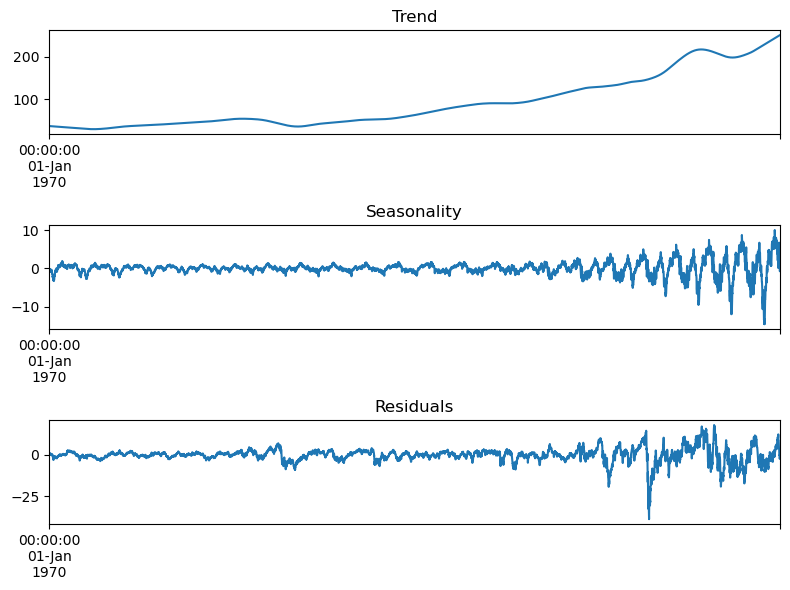

In [35]:
def perform_STL_decomposition(df):
    if not pd.api.types.is_datetime64_any_dtype(df.index):
        df.index = pd.to_datetime(df.index)

    wilshire_series = df['Wilshire 5000 Total Market Index'].dropna()

    period = 250  

    # Create the STL object and fit it
    stl = STL(wilshire_series, seasonal=13, period=period)  
    res = stl.fit()

    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(8, 6))
    res.trend.plot(ax=ax1, title='Trend')
    res.seasonal.plot(ax=ax2, title='Seasonality')
    res.resid.plot(ax=ax3, title='Residuals')
    plt.tight_layout()
    plt.show()

perform_STL_decomposition(df_daily_clean) #used only cleaned data, not standardized

23:47:33 - cmdstanpy - INFO - Chain [1] start processing
23:47:35 - cmdstanpy - INFO - Chain [1] done processing
c:\Users\augus\anaconda3\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
c:\Users\augus\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
c:\Users\augus\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(

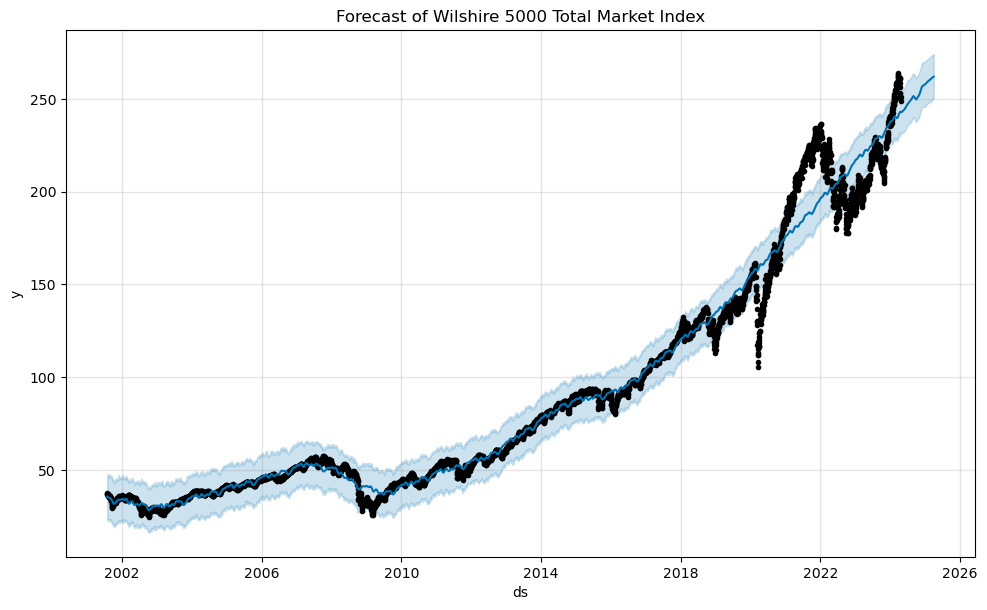

c:\Users\augus\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
c:\Users\augus\anaconda3\Lib\site-packages\prophet\plot.py:351: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  df_y['ds'].dt.to_pydatetime(), seas[name], ls='-', c='#0072B2')
c:\Users\augus\anaconda3\Lib\site-packages\prophet\plot.py:354: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np

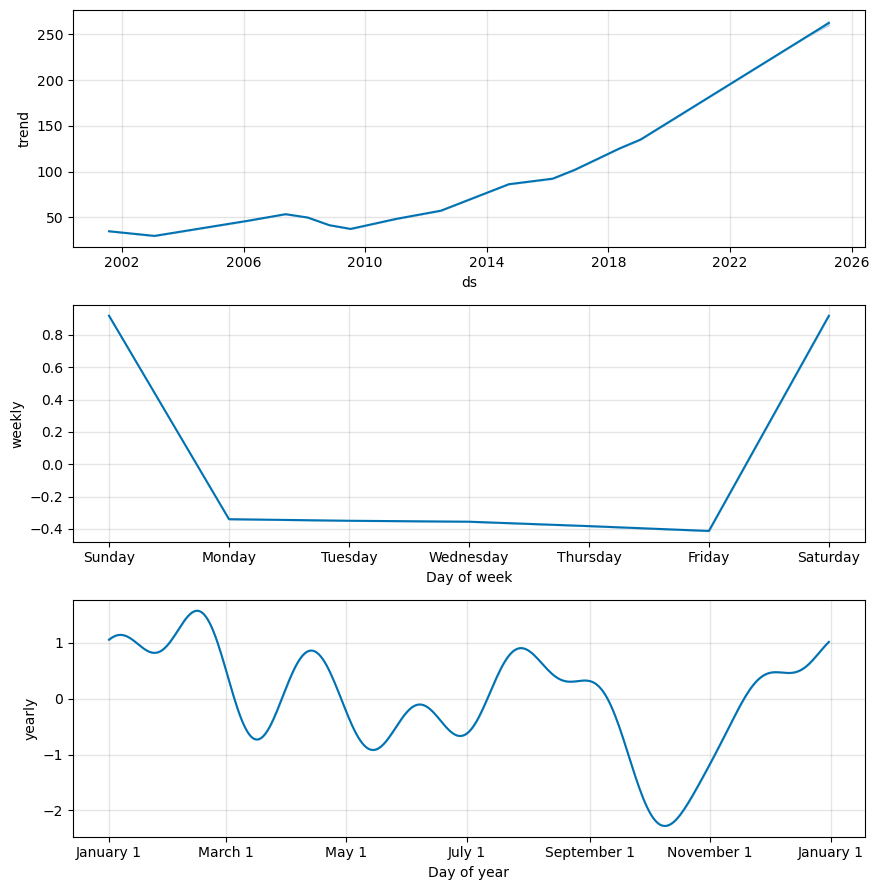

In [36]:
def perform_FB_phrophecy_magic(df):
    # Prep data
    df_prophet = df.reset_index().rename(columns={'date': 'ds', 'Wilshire 5000 Total Market Index': 'y'})

    # fit model
    m = Prophet()
    m.fit(df_prophet)

    # Prep future dataframe
    future = m.make_future_dataframe(periods=12, freq='M')

    forecast = m.predict(future)

    # Plot
    fig1 = m.plot(forecast)
    plt.title('Forecast of Wilshire 5000 Total Market Index')
    plt.show()

    # Plot
    fig2 = m.plot_components(forecast)
    plt.show()

perform_FB_phrophecy_magic(df_daily_clean)

In [37]:
# Created the code for the monthly data to lag or lead them
## Lag the variables
# #https://github.com/feature-engine/feature_engine/blob/main/feature_engine/timeseries/forecasting/lag_features.py
# def lag_the_features(df:pd.DataFrame, columns:int, periods, drop_na: bool): #needs to have the date column, periods need to be i.e. an int 1 or a list [1,2,3]
#     df = pd.DataFrame(df)
#     # df.set_index("DATE", inplace= True) #sort based on date

#     lf = LagFeatures(variables = columns, periods = periods, fill_value=None, 
#                  sort_index=True, missing_values='raise', 
#                  drop_original=False, drop_na=False)
    
#     # apply transformation
#     df_transformed_lagged = lf.fit_transform(df)

#     # display the transformed DataFrame with lag features
#     return df_transformed_lagged

# leading =["PPIACO", "HOUST", "PPIACO_NBD20200101", "HOUST_NBD20200101", "PPIACO_CHG", "HOUST_CHG", "PPIACO_CCA", "HOUST_CCA", "PPIACO_CCH", "HOUST_CCH"]

# lagging_monthly = ["UNRATE", "UMCSENT", "UMCSENT_NBD20200101", "UMCSENT_CHG", "UMCSENT_CCA", "UMCSENT_CCH"]

# coincident = ["PCE", "PCE.1", "PCE_NBD20200101", "PCE_NBD20200101.1", "PCE_CHG", "PCE_CHG.1",
#   "PCE_CCA", "PCE_CCH", "PCE_CCH.1", "INDPRO", "CPALTT01USM657N", 
#   "CPALTT01USM657N_NBD20200101", "CPALTT01USM657N_CHG", "CPALTT01USM657N_CCA",
#     "CPALTT01USM657N_CCH", "PSAVERT", "PSAVERT_NBD20200101", "PSAVERT_CHG", 
#     "PSAVERT_CCA", "PSAVERT_CCH", "FEDFUNDS", "FEDFUNDS_NBD20200101", 
#     "FEDFUNDS_CHG", "FEDFUNDS_CCA", "FEDFUNDS_CCH", "FEDFUNDS.1"]


# df_transformed_lagging_monthly =lag_the_features(macro_test_w_date, lagging_monthly, periods = [1,2,3], drop_na=False)
# # df_transformed_lagging_monthly.to_csv("df_transformed_lagging_monthly.csv")


# #returns something like below:
# 	# DATE	UNRATE	UNRATE_lag_1	UMCSENT_lag_1	UMCSENT_NBD20200101_lag_1	UMCSENT_CHG_lag_1	UMCSENT_CCA_lag_1	UMCSENT_CCH_lag_1	UNRATE_lag_2	UMCSENT_lag_2	UMCSENT_NBD20200101_lag_2	UMCSENT_CHG_lag_2	UMCSENT_CCA_lag_2	UMCSENT_CCH_lag_2	UNRATE_lag_3	UMCSENT_lag_3	UMCSENT_NBD20200101_lag_3	UMCSENT_CHG_lag_3	UMCSENT_CCA_lag_3	UMCSENT_CCH_lag_3
#     # 306	7/1/2013	7.3																		
#     # 307	8/1/2013	7.2	7.3	85.1	85.27054	1	14.18456	1.18205												
#     # 308	9/1/2013	7.2	7.2	82.1	82.26453	-3	-43.06682	-3.5889	7.3	85.1	85.27054	1	14.18456	1.18205						
#     # 309	2/1/2014	6.7	7.2	77.5	77.65531	-4.6	-69.1921	-5.76601	7.2	82.1	82.26453	-3	-43.06682	-3.5889	7.3	85.1	85.27054	1	14.18456	1.18205
#     # 310	3/1/2014	6.7	6.7	81.6	81.76353	0.4	5.89682	0.4914	7.2	77.5	77.65531	-4.6	-69.1921	-5.76601	7.2	82.1	82.26453	-3	-43.06682	-3.5889
#     # 311	4/1/2014	6.2	6.7	80	80.16032	-1.6	-23.76315	-1.98026	6.7	81.6	81.76353	0.4	5.89682	0.4914	7.2	77.5	77.65531	-4.6	-69.1921	-5.76601
